Bias correction based on the [python Package scikit-downscale](https://github.com/pangeo-data/scikit-downscale/blob/main/examples/2020ECAHM-scikit-downscale.ipynb)

Here, only the pointwise method to apply

First, comparison of observation and modelled data's behaviour
        Comparison of the distribution of data with boxplots
        Evolution through time with graphs

Second, BC at each meteorological station

# User input

In [1]:
# climate variable wanted
# observation data wanted

# modeled data wanted
# station of observation wanted 

climate_var = 'pr' # 'tas'

# precipitation : 'pr'

name_station = 'BEIRA, MZ'

# Packages and functions

## Packages

In [2]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import os
import os.path
from datetime import datetime

## Functions

### Data treatment

#### NOAA

In [3]:
# this function is meant to import the NOAA observation data
def import_treat_obs_NOAA():
    # path where the file is placed
    path_file_NOAA = r'C:\Users\CLMRX\COWI\A248363 - Climate analysis - Documents\General\CRVA_tool\Master_thesis\Project\3 - Implementation\1 - Data\1-BC\NOAA-ClimateDataOnline\3370204.csv'
    # read the information in the file
    data_obs_NOAA = pd.read_csv(path_file_NOAA)
    # unit of PRCP are mm
    # unit of temperature are degrees Celsius
    
    # add Year, month and season columns for graphs
    Year = data_obs_NOAA[['DATE']].values.reshape(len(data_obs_NOAA[['DATE']].values),)
    Month = data_obs_NOAA[['DATE']].values.reshape(len(data_obs_NOAA[['DATE']].values),)
    Season = data_obs_NOAA[['DATE']].values.reshape(len(data_obs_NOAA[['DATE']].values),)
    for i in np.arange(0,len(data_obs_NOAA[['DATE']].values)):
        Year[i]=int(Year[i][0:4])
        Month[i]=int(Month[i][5:7])
        if int(Month[i])>3 and int(Month[i])<10: # dry season in Mozambique is between April and September
            Season[i]='Dry'
        else:# humid season is between October and March
            Season[i]='Humid'

    data_obs_NOAA['Year'] = Year
    data_obs_NOAA['Month'] = Month
    data_obs_NOAA['Season'] = Season
    return data_obs_NOAA

In [4]:
# this function is meant to find which meteo stations are the closest to the projects of interest
# find which stations are of interest, which one are the closest to the coordinates of the projects
def find_closest_meteo_station_to_projects(data_obs_NOAA,name_projects,lat_projects,lon_projects):
    # save in a dataframe name, latitudes and longitudes informations for each station
    df_station_NOAA=data_obs_NOAA.loc[:, ["NAME", "LATITUDE","LONGITUDE"]]
    df_station_NOAA.drop_duplicates(inplace = True) # drop duplicates to only have name of the towns and latitudes and longitudes
    df_station_NOAA.reset_index(drop=True,inplace = True)  # drop = true avoids to keep the former index
    # inplace = True modifies the original dataframe
    
    name_closest_station_to_project = [] # create an empty list to contain the name of the closest station to each project
    index_closest_station_to_project = []
    for (i,name_project) in zip(np.arange(0,len(name_projects)),name_projects):
        # calculate difference between the different coordinates
        df_station_NOAA['Diff latitude project '+str(i)] = abs(abs(df_station_NOAA['LATITUDE']) - abs(lat_projects[i]))
        df_station_NOAA['Diff longitude project '+str(i)] = abs(abs(df_station_NOAA['LONGITUDE']) - abs(lon_projects[i]))
        df_station_NOAA['Diff coordinates project '+str(i)] = df_station_NOAA['Diff latitude project '+str(i)]+df_station_NOAA['Diff longitude project '+str(i)]
        # register the name of the stations that are the closest to the projects and the index in df_station_NOAA corresponding to those closest stations
        name_closest_station = df_station_NOAA['NAME'].iloc[np.where(df_station_NOAA['Diff coordinates project '+str(i)]==min(df_station_NOAA['Diff coordinates project '+str(i)]))[0][0]]
        name_closest_station_to_project.append(name_closest_station)
        index_closest_station_to_project.append(np.where(df_station_NOAA['Diff coordinates project '+str(i)]==min(df_station_NOAA['Diff coordinates project '+str(i)]))[0][0])
        print('The closest meteorological station to the project '+name_project+' is the one located in '+name_closest_station)


    # take off the duplicates from the list of name of station which are the closest to our projects and the indexes in the dataframe of those corresponding stations
    name_closest_station_to_project_without_duplicates=list(set(name_closest_station_to_project))
    index_closest_station_to_project_without_duplicates=list(set(index_closest_station_to_project))
    print('\n')
    print('The coordinates for the meteorological stations which are the closest to the project of interest are :')
    print('\n')
    for k in np.arange(len(index_closest_station_to_project_without_duplicates)):
        print('Name '+df_station_NOAA['NAME'][index_closest_station_to_project_without_duplicates[k]])
        print('Longitude '+str(df_station_NOAA['LONGITUDE'][index_closest_station_to_project_without_duplicates[k]]))
        print('Latitude '+str(df_station_NOAA['LATITUDE'][index_closest_station_to_project_without_duplicates[k]]))
        print('\n')

#### Gorongosa observation precipitation file

In [5]:
# this function is used to import and format data from Gorongosa in a certain format
def import_treat_observed_Gorongosa():
    
    if not os.path.isfile(r'C:\Users\CLMRX\COWI\A248363 - Climate analysis - Documents\General\CRVA_tool\Master_thesis\Project\3 - Implementation\1 - Data\1-BC\DirecltyfromMoz\Precipitation_Gorongosa_reformat.csv'):
        path_file_SIPA = r'C:\Users\CLMRX\COWI\A248363 - Climate analysis - Documents\General\CRVA_tool\Master_thesis\Project\3 - Implementation\1 - Data\1-BC\DirecltyfromMoz\Dados_e_grafico_P_812.xls'
        obs_SIPA=pd.read_excel(path_file_SIPA)
        obs_SIPA # need to register them in a more convenient way

        # create dataframe for register data from xls
        obs_pr_gorongosa_SIPA = pd.DataFrame()
        obs_pr_gorongosa_SIPA['time'] = pd.date_range('1980-01-01','2020-12-31') # create time column
        obs_pr_gorongosa_SIPA['time']=pd.to_datetime(obs_pr_gorongosa_SIPA["time"]).dt.strftime("%Y-%m-%d") # convert time information in str format

        obs_pr_gorongosa_SIPA['pr'] = np.nan
        obs_pr_gorongosa_SIPA = obs_pr_gorongosa_SIPA.set_index('time')

        name_column_list = list(obs_SIPA.columns)
        name_column_list.remove('Unnamed: 0')

        for square_of_data_index in np.where(obs_SIPA['Unnamed: 0']=='Dias')[0]:
            print('square_of_data_index '+str(square_of_data_index))
            for name_column in name_column_list:
                print('name_column '+name_column)
                for day in np.arange(1,32,1):
                    print('day '+str(day))
                    print('---------------')
                    date_str = str_year(obs_SIPA.iloc[square_of_data_index-1][name_column][obs_SIPA.iloc[square_of_data_index-1][name_column].rfind('.')+1:len(obs_SIPA.iloc[square_of_data_index-1][name_column])])+'-'+int_to_str_month(obs_SIPA.iloc[square_of_data_index-1][name_column][0:obs_SIPA.iloc[square_of_data_index-1][name_column].rfind('.')])+'-'+str_day(day)
                    print('index in pr'+ date_str)
                    value_excel = int()
                    print('value in excel '+ str(obs_SIPA.iloc[square_of_data_index+day][name_column] ))
                    obs_pr_gorongosa_SIPA['pr'].loc[date_str] = obs_SIPA.iloc[square_of_data_index+day][name_column]
        # export as a csv
        obs_pr_gorongosa_SIPA.to_csv(r'C:\Users\CLMRX\COWI\A248363 - Climate analysis - Documents\General\CRVA_tool\Master_thesis\Project\3 - Implementation\1 - Data\1-BC\DirecltyfromMoz\Precipitation_Gorongosa_reformat.csv')
    else: # the reformated file was already produced
        obs_pr_gorongosa_SIPA = pd.read_csv(r'C:\Users\CLMRX\COWI\A248363 - Climate analysis - Documents\General\CRVA_tool\Master_thesis\Project\3 - Implementation\1 - Data\1-BC\DirecltyfromMoz\Precipitation_Gorongosa_reformat.csv')
        obs_pr_gorongosa_SIPA = obs_pr_gorongosa_SIPA.set_index('time')
    return obs_pr_gorongosa_SIPA
    
# the following functions are used in the former function

# int_to_str_month transforms writen month in Portuguese in numbers
def int_to_str_month(str_month):
    if str_month == 'Out':
        int_m = '10'
    if str_month == 'Nov':
        int_m = '11'     
    if str_month == 'Dez':
        int_m = '12'
    if str_month == 'Jan':
        int_m = '01'      
    if str_month == 'Fev':
        int_m = '02'
    if str_month == 'Mar':
        int_m = '03'     
    if str_month == 'Abr':
        int_m = '04'
    if str_month == 'Mai':
        int_m = '05'
    if str_month == 'Jun':
        int_m = '06'
    if str_month == 'Jul':
        int_m = '07'     
    if str_month == 'Ago':
        int_m = '08'
    if str_month == 'Set':
        int_m = '09'   
    return int_m

# str_day transforms the number representing the day into a str
def str_day(day):
    if day <10:
        day = '0'+str(day)
    else:
        day = str(day)
    return day

# str_year transforms the abbreviation of the year into a year with 4 digits, in a str format
def str_year(year):
    if int(year)>=80:
        year = '19'+year
    else:
        year = '20'+year
    return year

#### NEX-GDDP-CMIP6

In [6]:
def import_treat_modeled_NEX_GDDP_CMIP6(climate_var):
    # import data
    #path_NEX_GDDP_CMIP6_EmplacementStation = r'\\COWI.net\projects\A245000\A248363\CRVA\Datasets\NEX-GDDP-CMIP6-AllMoz\csv_file\'+climate_var+'\pr_mm_per_day_day_1970-2014\Station_at_same_emplacement_as_NOAA_stationBeiraPembaChimoio_pr_1970-2014_projectsMoz.csv'
    #out_path = r'\\COWI.net\projects\A245000\A248363\CRVA\Datasets\NEX-GDDP-CMIP6-AllMoz\csv_file'
    if climate_var =='pr':
        path_NEX_GDDP_CMIP6_EmplacementStation=os.path.join(r'\\COWI.net\projects\A245000\A248363\CRVA\Datasets\NEX-GDDP-CMIP6-AllMoz\csv_file',climate_var,climate_var+'_mm_per_day_day_1970-2014_Closest_to_NOAA','NEXGDDPCMIP6_at_same_emplacement_as_NOAA_stationPembaChimoioBeira_'+climate_var+'_1970-2014_projectsMoz.csv')
    else: # temperature
        path_NEX_GDDP_CMIP6_EmplacementStation=os.path.join(r'\\COWI.net\projects\A245000\A248363\CRVA\Datasets\NEX-GDDP-CMIP6-AllMoz\csv_file',climate_var,climate_var+'_Celsius_day_1970-2014_Closest_to_NOAA','NEXGDDPCMIP6_at_same_emplacement_as_NOAA_stationPembaChimoioBeira_'+climate_var+'_1970-2014_projectsMoz.csv')
        
    data_NEX_GDDP_CMIP6_EmplacementStation = pd.read_csv(path_NEX_GDDP_CMIP6_EmplacementStation)
    data_NEX_GDDP_CMIP6_EmplacementStation = data_NEX_GDDP_CMIP6_EmplacementStation.drop(['Experiment','Latitude','Longitude'],axis=1)
    
    # add Year, month and season columns for graphs
    Year = data_NEX_GDDP_CMIP6_EmplacementStation[['Date']].values.reshape(len(data_NEX_GDDP_CMIP6_EmplacementStation[['Date']].values),)
    Month = data_NEX_GDDP_CMIP6_EmplacementStation[['Date']].values.reshape(len(data_NEX_GDDP_CMIP6_EmplacementStation[['Date']].values),)
    Season = data_NEX_GDDP_CMIP6_EmplacementStation[['Date']].values.reshape(len(data_NEX_GDDP_CMIP6_EmplacementStation[['Date']].values),)
    
    for i in np.arange(0,len(data_NEX_GDDP_CMIP6_EmplacementStation[['Date']].values)):
        Year[i]=int(Year[i][6:10])
        Month[i]=int(Month[i][3:5])
        if int(Month[i])>3 and int(Month[i])<10: # dry season in Mozambique is between April and September
            Season[i]='Dry'
        else:# humid season is between October and March
            Season[i]='Humid'

    data_NEX_GDDP_CMIP6_EmplacementStation['Year'] = Year
    data_NEX_GDDP_CMIP6_EmplacementStation['Month'] = Month
    data_NEX_GDDP_CMIP6_EmplacementStation['Season'] = Season
    
    return data_NEX_GDDP_CMIP6_EmplacementStation

### Compare climate variable at one station

In [7]:
def compare_(climate_var,data_obs_NOAA,name_station):
    path_figure= r'C:\Users\CLMRX\COWI\A248363 - Climate analysis - Documents\General\CRVA_tool\Master_thesis\Project\3 - Implementation\1 - Data\1-BC\ComparisonBetweenObsAndModeled'# path to register figure
    # meteorological data from NOAA
    # unit of precipitation is mm
    if (climate_var == 'pr') or (climate_var == 'Pr') or (climate_var == 'PR') or (climate_var == 'precipitation') or (climate_var == 'Precipitation') or (climate_var == 'PRECIPITATION'):
        title_column_obs = 'PRCP'
        title_column_modeled = 'Mean of the daily precipitation rate mm/day'
        climate_var_full_name = 'precipitation'
        climate_var_abreviation = 'pr'
        #climate_var_obs_NOAA_station=data_obs_NOAA[['DATE',title_column_obs,'Year','Month','Season']][data_obs_NOAA['NAME']==name_station].reset_index(drop=True)
        # data from NEX GDDP CMIP6 at the emplacement of the station
        #data_NEX_GDDP_CMIP6_EmplacementStation=import_treat_modeled_NEX_GDDP_CMIP6(climate_var_abreviation)
        #data_NEX_GDDP_CMIP6_EmplacementStation_station=data_NEX_GDDP_CMIP6_EmplacementStation[data_NEX_GDDP_CMIP6_EmplacementStation['Name station']==name_station]
        #list_models_NEX_GDDP_CMIP6 = list(set(data_NEX_GDDP_CMIP6_EmplacementStation_station['Model']))
        #data_NEX_GDDP_CMIP6_EmplacementStation_station = data_NEX_GDDP_CMIP6_EmplacementStation_station.drop(['Name station'],axis =1)
    
    if (climate_var == 'tas') or (climate_var == 'TAS') or (climate_var == 'Tas') or (climate_var == 'temperature') or (climate_var == 'Temperature') or (climate_var == 'TEMPERATURE'):
        title_column_obs = 'TAVG'
        title_column_modeled = 'Daily Near-Surface Air Temperature °C'
        climate_var_full_name = 'temperature'
        climate_var_abreviation = 'tas'
        
    if (climate_var == 'tasmax') or (climate_var == 'TASMAX') or (climate_var == 'Tasmax') or (climate_var == 'temperature maximum') or (climate_var == 'Temperature maximum') or (climate_var == 'TEMPERATURE MAXIMUM'):
        title_column_obs = 'TMAX'
        title_column_modeled = 'Daily Maximum Near-Surface Air Temperature °C'
        climate_var_full_name = 'maximum temperature'
        climate_var_abreviation = 'tasmax'
        
    if (climate_var == 'tasmin') or (climate_var == 'TASMIN') or (climate_var == 'Tasmin') or (climate_var == 'temperature minimum') or (climate_var == 'Temperature minimum') or (climate_var == 'TEMPERATURE MINIMUM'):
        title_column_obs = 'TMIN'
        title_column_modeled = 'Daily Minimum Near-Surface Air Temperature °C'
        climate_var_full_name = 'minimum temperature'
        climate_var_abreviation = 'tasmin'
        
    # deal with the degree symbol in title_column_modeled
    if '°' in title_column_modeled:
        title_column_modeled=title_column_modeled[0:title_column_modeled.rfind('°')]+u'\N{DEGREE SIGN}C'
    climate_var_obs_NOAA_station=data_obs_NOAA[['DATE',title_column_obs,'Year','Month','Season']][data_obs_NOAA['NAME']==name_station].reset_index(drop=True)
    # data from NEX GDDP CMIP6 at the emplacement of the station
    data_NEX_GDDP_CMIP6_EmplacementStation=import_treat_modeled_NEX_GDDP_CMIP6(climate_var_abreviation)
    data_NEX_GDDP_CMIP6_EmplacementStation_station=data_NEX_GDDP_CMIP6_EmplacementStation[data_NEX_GDDP_CMIP6_EmplacementStation['Name station']==name_station]
    list_models_NEX_GDDP_CMIP6 = list(set(data_NEX_GDDP_CMIP6_EmplacementStation_station['Model']))
    data_NEX_GDDP_CMIP6_EmplacementStation_station = data_NEX_GDDP_CMIP6_EmplacementStation_station.drop(['Name station'],axis =1)
    #return title_column_modeled,data_NEX_GDDP_CMIP6_EmplacementStation_station
    
    # Select only part of the dataframe, to have the same period in both
    (climate_var_obs_NOAA_station, data_NEX_GDDP_CMIP6_EmplacementStation_station,start_year,stop_year)=take_out_years_not_overlaping(climate_var_obs_NOAA_station, data_NEX_GDDP_CMIP6_EmplacementStation_station)
    
    # prepare name_station to be used for plots
    name_station = name_station[0:name_station.rfind(',')].lower()
    # do box plot for different model
    plot_boxplots(climate_var_abreviation,data_NEX_GDDP_CMIP6_EmplacementStation_station,climate_var_obs_NOAA_station,start_year,stop_year,list_models_NEX_GDDP_CMIP6,title_column_obs,title_column_modeled,climate_var_abreviation,climate_var_full_name,path_figure,name_station)

    # graphs
    if climate_var_abreviation =='pr':
        plot_(climate_var_obs_NOAA_station,data_NEX_GDDP_CMIP6_EmplacementStation_station,'Yearly sum',climate_var_abreviation,climate_var_full_name,title_column_obs,title_column_modeled,'NOAA','NEX-GDDP-CMIP6',name_station,start_year,stop_year,list_models_NEX_GDDP_CMIP6,path_figure)
        plot_(climate_var_obs_NOAA_station,data_NEX_GDDP_CMIP6_EmplacementStation_station,'Seasonal sum',climate_var_abreviation,climate_var_full_name,title_column_obs,title_column_modeled,'NOAA','NEX-GDDP-CMIP6',name_station,start_year,stop_year,list_models_NEX_GDDP_CMIP6,path_figure)
        
    plot_(climate_var_obs_NOAA_station,data_NEX_GDDP_CMIP6_EmplacementStation_station,'Yearly average',climate_var_abreviation,climate_var_full_name,title_column_obs,title_column_modeled,'NOAA','NEX-GDDP-CMIP6',name_station,start_year,stop_year,list_models_NEX_GDDP_CMIP6,path_figure)
    plot_(climate_var_obs_NOAA_station,data_NEX_GDDP_CMIP6_EmplacementStation_station,'Yearly median',climate_var_abreviation,climate_var_full_name,title_column_obs,title_column_modeled,'NOAA','NEX-GDDP-CMIP6',name_station,start_year,stop_year,list_models_NEX_GDDP_CMIP6,path_figure)    
    plot_(climate_var_obs_NOAA_station,data_NEX_GDDP_CMIP6_EmplacementStation_station,'Seasonal average',climate_var_abreviation,climate_var_full_name,title_column_obs,title_column_modeled,'NOAA','NEX-GDDP-CMIP6',name_station,start_year,stop_year,list_models_NEX_GDDP_CMIP6,path_figure)
    plot_(climate_var_obs_NOAA_station,data_NEX_GDDP_CMIP6_EmplacementStation_station,'Seasonal median',climate_var_abreviation,climate_var_full_name,title_column_obs,title_column_modeled,'NOAA','NEX-GDDP-CMIP6',name_station,start_year,stop_year,list_models_NEX_GDDP_CMIP6,path_figure)    

In [8]:
def take_out_years_not_overlaping(climate_var_obs_NOAA_station, data_NEX_GDDP_CMIP6_EmplacementStation_station):
    if max(climate_var_obs_NOAA_station['Year'])>max(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year']):
        if min(climate_var_obs_NOAA_station['Year'])>min(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year']):
            start_year = min(climate_var_obs_NOAA_station['Year'])
            stop_year = max(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])
        else:
            start_year = min(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])
            stop_year = max(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])        
    else:
        if min(climate_var_obs_NOAA_station['Year'])>min(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year']):
            start_year = min(climate_var_obs_NOAA_station['Year'])
            stop_year = max(climate_var_obs_NOAA_station['Year'])
        else:
            start_year = min(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])
            stop_year = max(climate_var_obs_NOAA_station['Year'])
    data_NEX_GDDP_CMIP6_EmplacementStation_station = data_NEX_GDDP_CMIP6_EmplacementStation_station[data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'].between(start_year,stop_year)]
    climate_var_obs_NOAA_station = climate_var_obs_NOAA_station[climate_var_obs_NOAA_station['Year'].between(start_year,stop_year)]

    if max(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])>max(climate_var_obs_NOAA_station['Year']):
        stop_year = max(climate_var_obs_NOAA_station['Year'])
    else:
        stop_year = max(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])
    if min(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])>min(climate_var_obs_NOAA_station['Year']):
        start_year = min(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])
    else:
        start_year = min(climate_var_obs_NOAA_station['Year'])

    climate_var_obs_NOAA_station = climate_var_obs_NOAA_station[climate_var_obs_NOAA_station['Year'].between(start_year, stop_year)]
    data_NEX_GDDP_CMIP6_EmplacementStation_station = data_NEX_GDDP_CMIP6_EmplacementStation_station[data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'].between(start_year, stop_year)]
    
    return climate_var_obs_NOAA_station, data_NEX_GDDP_CMIP6_EmplacementStation_station,start_year,stop_year

In [9]:
def take_out_years_not_overlaping2(climate_var_obs_NOAA_station, data_NEX_GDDP_CMIP6_EmplacementStation_station):
    if max(climate_var_obs_NOAA_station['Year'])>max(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year']):
        if min(climate_var_obs_NOAA_station['Year'])>min(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year']):
            start_year = min(climate_var_obs_NOAA_station['Year'])
            stop_year = max(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])
        else:
            start_year = min(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])
            stop_year = max(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])        
    else:
        if min(climate_var_obs_NOAA_station['Year'])>min(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year']):
            start_year = min(climate_var_obs_NOAA_station['Year'])
            stop_year = max(climate_var_obs_NOAA_station['Year'])
        else:
            start_year = min(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])
            stop_year = max(climate_var_obs_NOAA_station['Year'])
    data_NEX_GDDP_CMIP6_EmplacementStation_station = data_NEX_GDDP_CMIP6_EmplacementStation_station[data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'].between(start_year,stop_year)]
    climate_var_obs_NOAA_station = climate_var_obs_NOAA_station[climate_var_obs_NOAA_station['Year'].between(start_year,stop_year)]

    if max(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])>max(climate_var_obs_NOAA_station['Year']):
        stop_year = max(climate_var_obs_NOAA_station['Year'])
    else:
        stop_year = max(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])
    if min(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])>min(climate_var_obs_NOAA_station['Year']):
        start_year = min(data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'])
    else:
        start_year = min(climate_var_obs_NOAA_station['Year'])

    climate_var_obs_NOAA_station = climate_var_obs_NOAA_station[climate_var_obs_NOAA_station['Year'].between(start_year, stop_year)]
    data_NEX_GDDP_CMIP6_EmplacementStation_station = data_NEX_GDDP_CMIP6_EmplacementStation_station[data_NEX_GDDP_CMIP6_EmplacementStation_station['Year'].between(start_year, stop_year)]
    
    return climate_var_obs_NOAA_station, data_NEX_GDDP_CMIP6_EmplacementStation_station,start_year,stop_year

### Plots

In [10]:
def plot_boxplots(climate_var,data_NEX_GDDP_CMIP6_EmplacementStation_station,climate_var_obs_NOAA_station,start_year,stop_year,list_models_NEX_GDDP_CMIP6,column_name_obs,title_column_model,climate_var_abreviation,climate_var_full_name,path_figure,name_station):
    # constructing the dictionarry for the boxplot
    data_boxplot = []
    labels_boxplot=[]
    colors = []
    # add observational data
    data_of_interest = climate_var_obs_NOAA_station[column_name_obs].values
    data_filtered = data_of_interest[~np.isnan(data_of_interest)]
    data_boxplot.append(data_filtered)
    labels_boxplot.append('Obs NOAA')
    #colors.append('pink')
    for model in list_models_NEX_GDDP_CMIP6:
        data_of_interest = data_NEX_GDDP_CMIP6_EmplacementStation_station[title_column_model][data_NEX_GDDP_CMIP6_EmplacementStation_station['Model']==model].values
        data_filtered = data_of_interest[~np.isnan(data_of_interest)]
        data_boxplot.append(data_filtered)
        labels_boxplot.append(model)
        #colors.append('lightblue')


    # problem where there are NaN in a series of values, does not produce a boxplot
    # need to take the Nan out

    # count how much Nan and for which models

    several_boxplot(data_boxplot,labels_boxplot,start_year,stop_year,climate_var_abreviation,climate_var_full_name,'NOAA','NEX-GDDP-CMIP6',title_column_model,'Observational data vs Models',path_figure,name_station)

In [11]:
# the function several_boxplot is a function to plot several boxplots in one graph (to compare them)
# the inputs:
#    the data in a certainn format, the length should be the same as the text_label
#    text_label contains the name of each set of data to be presented in boxplots
#   All the following inputs are used for titles or labels
#    climate_var is the climate variable of interest (example:'precipitation')
#    source_obs is the source of the observation data
#    source_modeled is the source of the modeled data
#    full_name_climate_var is the complete name of the climate variable of interest (example:'Mean of the daily precipitation rate mm/day')
#    y_label_text is the label for the y axis (example:'Observational data vs Models')
#    path is the out_path where to register data
def several_boxplot(data_boxplot,text_label,start_year,stop_year,climate_var_abreviation,climate_var,source_obs,source_modeled,full_name_climate_var,y_label_text,path_figure,name_station):
    fig, ax = plt.subplots(figsize=(8,6))  # decide size of the figure, WIDTH_SIZE,HEIGHT_SIZE
    colors = [] # prepare empty list to registere wanted colors
    # fontsize of grpahs elements
    SMALL_SIZE = 12
    MEDIUM_SIZE = 14
    BIGGER_SIZE = 16

    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
    plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
    bp=plt.boxplot(data_boxplot,labels = text_label,notch=True, whis =(10,90),patch_artist = True,showfliers=True)
    # showfliers=False permits to have the boxplot without outliers
    # documentation about boxplot
    # ... present boxplot over the period for each models
    # this functions returns varius parameters of the boxplot in the dict_boxplot. This funcitons also returns an image of it
    # here, numpy_array is a vector. But can also include array with several columns. Each columns will have a boxplot
    # 'notch' is true to enhance part where the median is
    # 'whis' is the percentile value for the whiskers, every data out of the range indicted by those 2 floats are represented as points
    # 'widths' determine width of the boxes
    # 'patch_artist' colors the boxplots
    # 'labels' gives a name to every column included in the data part

    # prepare color depending on content of labels
    for i in np.arange(0,len(text_label)):
        if ('obs' in text_label[i]) or ('Obs' in text_label[i]):
            colors.append('lightpink')
        else:
            colors.append('lightblue')
    # fill colors with vector just prepared
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
    
    plt.xticks(rotation=90) # to have the labels vertical
    # label axes and figure
    plt.xlabel(y_label_text)
    plt.ylabel(full_name_climate_var)
    plt.title('Boxplot presenting ditribution of '+climate_var+' data of the '+source_obs+'\nobservation data vs '+source_modeled+' modeled data between '+str(start_year)+' and '+str(stop_year))
    plt.tight_layout() # Adjust the padding between and around subplots.
    
    # add legend
    ax.legend([bp['boxes'][0],bp['boxes'][1]], ['Observed', 'Modeled'])
    title_png = climate_var+'_'+'boxplot'+'_'+source_obs+'_'+source_modeled+'_'+name_station+'.png'
    #if not os.path.isfile(path_to_figure):
    if not os.path.isdir(os.path.join(path_figure,'figures3','Boxplots',climate_var_abreviation,name_station)):
        os.makedirs(os.path.join(path_figure,'figures3','Boxplots',climate_var_abreviation,name_station)) # ensure creation of the path
    
    path_to_figure = os.path.join(path_figure,'figures3','Boxplots',climate_var_abreviation,name_station,title_png)
    path_to_figure=path_length(path_to_figure)
    plt.savefig(path_to_figure,format ='png') # savefig or save text must be before plt.show. for savefig, format should be explicity written

    plt.show()

# this function is to plot the statistics of the evolution of the climate variable of interest for a certain station
def plot_(data_obs,data_model,stats,climate_var_abreviation,climate_var,title_column_obs,title_column_modeled,source_obs,source_modeled,name_station,start_year,stop_year,list_models_NEX_GDDP_CMIP6,path_figure):
    if 'temperature' in climate_var:
        unit = u'\N{DEGREE SIGN}C'
    if climate_var == 'precipitation':
        if 'sum' in stats:
            unit ='mm/year'
        else:
            unit ='mm/day'
    plt.figure(figsize=(10,6)) # decide size of the figure, WIDTH_SIZE,HEIGHT_SIZE
    # fontsize of grpahs elements
    SMALL_SIZE = 12
    MEDIUM_SIZE = 14
    BIGGER_SIZE = 16

    plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
    plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
    plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
    plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
    plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title
            
    if stats == 'Yearly sum':
        for model in list_models_NEX_GDDP_CMIP6:
            yearly_climate_var_NEX_GDDP_CMIP6 = data_model[data_model['Model']==model].groupby('Year')[[title_column_modeled]].sum().rename(columns = {title_column_modeled:'Yearly '+climate_var+' '+unit})
            plt.plot(yearly_climate_var_NEX_GDDP_CMIP6.index,yearly_climate_var_NEX_GDDP_CMIP6,label=model)
        climate_var_yearly_obs=data_obs.groupby('Year')[[title_column_obs]].sum()
    if stats == 'Yearly average':
        for model in list_models_NEX_GDDP_CMIP6:
            yearly_climate_var_NEX_GDDP_CMIP6 = data_model[data_model['Model']==model].groupby('Year')[[title_column_modeled]].mean().rename(columns = {title_column_modeled:'Average yearly '+climate_var+' '+unit})
            plt.plot(yearly_climate_var_NEX_GDDP_CMIP6.index,yearly_climate_var_NEX_GDDP_CMIP6,label=model)
        climate_var_yearly_obs=data_obs.groupby('Year')[[title_column_obs]].mean()
    if stats == 'Yearly median':
        for model in list_models_NEX_GDDP_CMIP6:
            yearly_climate_var_NEX_GDDP_CMIP6 = data_model[data_model['Model']==model].groupby('Year')[[title_column_modeled]].median().rename(columns = {title_column_modeled:'Median yearly '+climate_var+' '+unit})
            plt.plot(yearly_climate_var_NEX_GDDP_CMIP6.index,yearly_climate_var_NEX_GDDP_CMIP6,label=model)
        climate_var_yearly_obs=data_obs.groupby('Year')[[title_column_obs]].median()
        if climate_var == 'precipitation':
            plt.ylim(0,1.5)
        
    if 'Seasonal' in stats:
        
        if stats == 'Seasonal sum':
            for model in list_models_NEX_GDDP_CMIP6:
                yearly_climate_var_NEX_GDDP_CMIP6 = data_model[data_model['Model']==model].groupby(['Year','Season'])[[title_column_modeled]].sum().rename(columns = {title_column_modeled:stats+' '+climate_var+' mm/season each year'})
                yearly_climate_var_NEX_GDDP_CMIP6 = yearly_climate_var_NEX_GDDP_CMIP6.reset_index() # put Year and Season as columns
                yearly_climate_var_NEX_GDDP_CMIP6 = yearly_climate_var_NEX_GDDP_CMIP6.drop(['Season'],axis=1) # drop the columns Year and season
                yearly_climate_var_NEX_GDDP_CMIP6 = yearly_climate_var_NEX_GDDP_CMIP6.set_index('Year')
                plt.plot(yearly_climate_var_NEX_GDDP_CMIP6.index,yearly_climate_var_NEX_GDDP_CMIP6,label=model)
            climate_var_yearly_obs=data_obs.groupby(['Year','Season'])[[title_column_obs]].sum()
        if stats == 'Seasonal average':
            for model in list_models_NEX_GDDP_CMIP6:
                yearly_climate_var_NEX_GDDP_CMIP6 = data_model[data_model['Model']==model].groupby(['Year','Season'])[[title_column_modeled]].mean().rename(columns = {title_column_modeled:stats+' '+climate_var+unit})
                yearly_climate_var_NEX_GDDP_CMIP6 = yearly_climate_var_NEX_GDDP_CMIP6.reset_index() # put Year and Season as columns
                yearly_climate_var_NEX_GDDP_CMIP6 = yearly_climate_var_NEX_GDDP_CMIP6.set_index('Year') # set the colomun with both information as the new column
                yearly_climate_var_NEX_GDDP_CMIP6 = yearly_climate_var_NEX_GDDP_CMIP6.drop(['Season'],axis=1) # drop the columns Year and season
                plt.plot(yearly_climate_var_NEX_GDDP_CMIP6.index,yearly_climate_var_NEX_GDDP_CMIP6,label=model)
            climate_var_yearly_obs=data_obs.groupby(['Year','Season'])[[title_column_obs]].mean()
            
        if stats == 'Seasonal median':
            for model in list_models_NEX_GDDP_CMIP6:
                yearly_climate_var_NEX_GDDP_CMIP6 = data_model[data_model['Model']==model].groupby(['Year','Season'])[[title_column_modeled]].median().rename(columns = {title_column_modeled:stats+' '+climate_var+unit})
                yearly_climate_var_NEX_GDDP_CMIP6 = yearly_climate_var_NEX_GDDP_CMIP6.reset_index() # put Year and Season as columns
                yearly_climate_var_NEX_GDDP_CMIP6 = yearly_climate_var_NEX_GDDP_CMIP6.set_index('Year') # set the colomun with both information as the new column
                yearly_climate_var_NEX_GDDP_CMIP6 = yearly_climate_var_NEX_GDDP_CMIP6.drop(['Season'],axis=1) # drop the columns Year and season
                plt.plot(yearly_climate_var_NEX_GDDP_CMIP6.index,yearly_climate_var_NEX_GDDP_CMIP6,label=model)
                
            climate_var_yearly_obs=data_obs.groupby(['Year','Season'])[[title_column_obs]].median()
        # managed the observation data for seasonal stats
        climate_var_yearly_obs = climate_var_yearly_obs.reset_index() # put Year and Season as columns
        climate_var_yearly_obs = climate_var_yearly_obs.set_index('Year') # set the colomun with both information as the new column
        climate_var_yearly_obs = climate_var_yearly_obs.drop(['Season'],axis=1) # drop the columns Year and season
        plt.xticks(np.arange(start_year, stop_year, step=5))  # Set label locations.
    plt.plot(climate_var_yearly_obs.index,climate_var_yearly_obs,'k',label='observation')
    plt.xlabel('Years')
    plt.ylabel(stats+' '+climate_var+unit)
    plt.title(stats+' '+climate_var+' '+unit+' accross models from '+source_modeled+', with observation\nfrom '+source_obs+', at station '+name_station+', between '+str(start_year)+' and '+str(stop_year))
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    
    plt.tight_layout() # Adjust the padding between and around subplots.
    title_png = climate_var+'_'+stats.replace(' ','')+'_'+'graph'+'_'+source_obs+'_'+source_modeled+'_'+name_station+'.png'
    #if not os.path.isfile(path_to_figure): # the file does not exists
    if not os.path.isdir(os.path.join(path_figure,'figures3','Graphs',climate_var,name_station)):
        print('File is created')
        os.makedirs(os.path.join(path_figure,'figures3','Graphs',climate_var,name_station)) # ensure creation of the path
    path_to_figure = os.path.join(path_figure,'figures3','Graphs',climate_var,name_station,title_png)
    path_to_figure=path_length(path_to_figure)
    plt.savefig(path_to_figure,format ='png') # savefig or save text must be before plt.show. for savefig, format should be explicity written
    plt.show()

In [12]:
# this functions test if the path is too long
# if the path is more than 250 char, the path wll be modified in order for windows to accept is as a path

def path_length(str1):
    if len(str1)>250:
        path = os.path.abspath(str1) # normalize path
        if path.startswith(u"\\\\"):
            path=u"\\\\?\\UNC\\"+path[2:]
        else:
            path=u"\\\\?\\"+path
        return path
    else:
        return str1

# Project information
Those project were chosen based on the interest of the company (decided with SIPA and RAPY)

In [13]:
name_projects_data = np.array(['WTP_Mutua_EIB', 'Gorongosa_EIB', 'Chimoio_WTP_EIB', 'Pemba_EIB'])
name_projects = pd.Series(name_projects_data)

lon_projects_data = np.array([34.5927839939706, 34.07824286310398 , 33.47333313659342, 40.52545156033736])
lon_projects = pd.Series(lon_projects_data)

lat_projects_data = np.array([-19.495079648575242, -18.68063728746643, -19.125095255188334,-12.973942656747809])
lat_projects = pd.Series(lat_projects_data)

# Comparaison between observational data and modeled data

## Observation data coming from the place

Excel 'Dados_e_grafico_P_812.xls', was given by SIPA, who has received it from André Görgens (Cosnultant, Water resources Management, Zutari) in an email, on the 20th of June 2023.

Those data can be use as precipitation observation data for the town of Gorongosa.

In [14]:
obs_pr_gorongosa_SIPA = import_treat_observed_Gorongosa()

In [15]:
obs_pr_gorongosa_SIPA

,pr
time,
1980-01-01,NaN
1980-01-02,NaN
1980-01-03,NaN
1980-01-04,NaN
1980-01-05,NaN
...,...
2020-12-27,2.7
2020-12-28,0
2020-12-29,0


In [16]:
## Compare observational data coming from gorongosa to the values of NEX-GDDP-CMIP6 at a point in Gorongosa

## Observational data coming from NOAA
[Global Historical Climatology Network daily (GHCNd) | National Centers for Environmental Information (NCEI) (noaa.gov)](https://www.ncei.noaa.gov/products/land-based-station/global-historical-climatology-network-daily), climate data online

In [17]:
data_obs_NOAA=import_treat_obs_NOAA()
data_obs_NOAA.columns

Index(['STATION', 'NAME', 'LATITUDE', 'LONGITUDE', 'ELEVATION', 'DATE', 'PRCP',
       'PRCP_ATTRIBUTES', 'TAVG', 'TAVG_ATTRIBUTES', 'TMAX', 'TMAX_ATTRIBUTES',
       'TMIN', 'TMIN_ATTRIBUTES', 'Year', 'Month', 'Season'],
      dtype='object')

In [18]:
data_obs_NOAA

,STATION,NAME,LATITUDE,LONGITUDE,ELEVATION,DATE,PRCP,PRCP_ATTRIBUTES,TAVG,TAVG_ATTRIBUTES,TMAX,TMAX_ATTRIBUTES,TMIN,TMIN_ATTRIBUTES,Year,Month,Season
0,MZM00067223,"MONTEPUEZ, MZ",-13.133,39.033,535.0,1974-04-05,2.0,",,S",23.8,"H,,S",29.0,",D,S",20.0,",,S",1974,4,Dry
1,MZM00067223,"MONTEPUEZ, MZ",-13.133,39.033,535.0,1974-06-17,0.0,",,S",18.2,"H,,S",27.0,",,S",11.0,",,S",1974,6,Dry
2,MZM00067223,"MONTEPUEZ, MZ",-13.133,39.033,535.0,1974-06-23,NaN,NaN,21.0,"H,,S",NaN,NaN,NaN,NaN,1974,6,Dry
3,MZM00067223,"MONTEPUEZ, MZ",-13.133,39.033,535.0,1974-07-02,0.0,",,S",21.5,"H,,S",NaN,NaN,16.0,",,S",1974,7,Dry
4,MZM00067223,"MONTEPUEZ, MZ",-13.133,39.033,535.0,1974-07-03,0.0,",,S",20.5,"H,,S",NaN,NaN,16.0,",,S",1974,7,Dry
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161770,MZ000067297,"BEIRA, MZ",-19.800,34.900,16.0,2020-12-27,NaN,NaN,28.8,"H,,S",32.3,",,S",NaN,NaN,2020,12,Humid
161771,MZ000067297,"BEIRA, MZ",-19.800,34.900,16.0,2020-12-28,NaN,NaN,29.4,"H,,S",NaN,NaN,25.0,",,S",2020,12,Humid
161772,MZ000067297,"BEIRA, MZ",-19.800,34.900,16.0,2020-12-29,NaN,NaN,29.6,"H,,S",NaN,NaN,26.0,",,S",2020,12,Humid
161773,MZ000067297,"BEIRA, MZ",-19.800,34.900,16.0,2020-12-30,24.9,",,S",28.3,"H,,S",31.2,",,S",25.7,",,S",2020,12,Humid


In [19]:
find_closest_meteo_station_to_projects(data_obs_NOAA,name_projects,lat_projects,lon_projects)

The closest meteorological station to the project WTP_Mutua_EIB is the one located in BEIRA, MZ
The closest meteorological station to the project Gorongosa_EIB is the one located in CHIMOIO, MZ
The closest meteorological station to the project Chimoio_WTP_EIB is the one located in CHIMOIO, MZ
The closest meteorological station to the project Pemba_EIB is the one located in PEMBA, MZ


The coordinates for the meteorological stations which are the closest to the project of interest are :


Name CHIMOIO, MZ
Longitude 33.467
Latitude -19.117


Name BEIRA, MZ
Longitude 34.9
Latitude -19.8


Name PEMBA, MZ
Longitude 40.533
Latitude -12.983




In [20]:
list(set(data_obs_NOAA['NAME']))

['PANDA INHAMBANE, MZ',
 'MAPUTO, MZ',
 'LICHINGA, MZ',
 'MOCIMBOA DA PRAIA, MZ',
 'MAPULANGUENE MAPUTO, MZ',
 'TETE, MZ',
 'NAMPULA, MZ',
 'PEMBA, MZ',
 'ANGOCHE, MZ',
 'VILANKULO, MZ',
 'LUMBO, MZ',
 'BEIRA, MZ',
 'MONTEPUEZ, MZ',
 'PAFURI, SF',
 'INHAMBANE, MZ',
 'CHIMOIO, MZ',
 'XAI XAI, MZ',
 'CUAMBA, MZ',
 'CHANGALANE, MZ']

In [21]:
data_obs_NOAA[data_obs_NOAA['NAME']=='GORONGOSA, MZ']

,STATION,NAME,LATITUDE,LONGITUDE,ELEVATION,DATE,PRCP,PRCP_ATTRIBUTES,TAVG,TAVG_ATTRIBUTES,TMAX,TMAX_ATTRIBUTES,TMIN,TMIN_ATTRIBUTES,Year,Month,Season


## Data at the same emplacement coming from NEX GDDP CMIP6
 
[NEX-GDDP-CMIP6](https://www.nccs.nasa.gov/services/data-collections/land-based-products/nex-gddp-cmip6) data are CMIP6 data, bias corrected by NASA, with [Global Meteorological Forcing Dataset (GMFD) for Land Surface Modeling](https://aquaknow.jrc.ec.europa.eu/en/content/global-meteorological-forcing-dataset-land-surface-modeling-pgfprinceton) (which are [reanalysis data](https://www.researchgate.net/publication/200472354_Development_of_a_50-Year_High-Resolution_Global_Dataset_of_Meteorological_Forcings_for_Land_Surface_Modeling)). More information about NEX-GDDP-CMIP6 data in the [technical note](https://www.nccs.nasa.gov/sites/default/files/NEX-GDDP-CMIP6-Tech_Note.pdf).
 
 
 With information found with precedent file, the values produced by NEX-GDDP-CMIP6 at the emplacement of the meteorological stations, that are the closest to the projects of interest, are compiled in a file named EmplacementStationNOAA_pr_1970-2014_projectsMoz.csv

In [22]:
climate_var_NEX_GDDP_CMIP6_EmplacementStation=import_treat_modeled_NEX_GDDP_CMIP6(climate_var)

In [23]:

climate_var_NEX_GDDP_CMIP6_EmplacementStation

,Name station,Model,Date,Mean of the daily precipitation rate mm/day,Year,Month,Season
0,"PEMBA, MZ",ACCESS-CM2,01-01-1970,12.524136,1970,1,Humid
1,"PEMBA, MZ",ACCESS-CM2,02-01-1970,8.813054,1970,1,Humid
2,"PEMBA, MZ",ACCESS-CM2,03-01-1970,15.381735,1970,1,Humid
3,"PEMBA, MZ",ACCESS-CM2,04-01-1970,4.983678,1970,1,Humid
4,"PEMBA, MZ",ACCESS-CM2,05-01-1970,2.094941,1970,1,Humid
...,...,...,...,...,...,...,...
739615,"BEIRA, MZ",TaiESM1,27-12-2014,3.778890,2014,12,Humid
739616,"BEIRA, MZ",TaiESM1,28-12-2014,5.969581,2014,12,Humid
739617,"BEIRA, MZ",TaiESM1,29-12-2014,3.112424,2014,12,Humid
739618,"BEIRA, MZ",TaiESM1,30-12-2014,0.000000,2014,12,Humid


## Compare precipitation data for different stations

In [24]:
# select climate variable and meteorological station; select data and plot

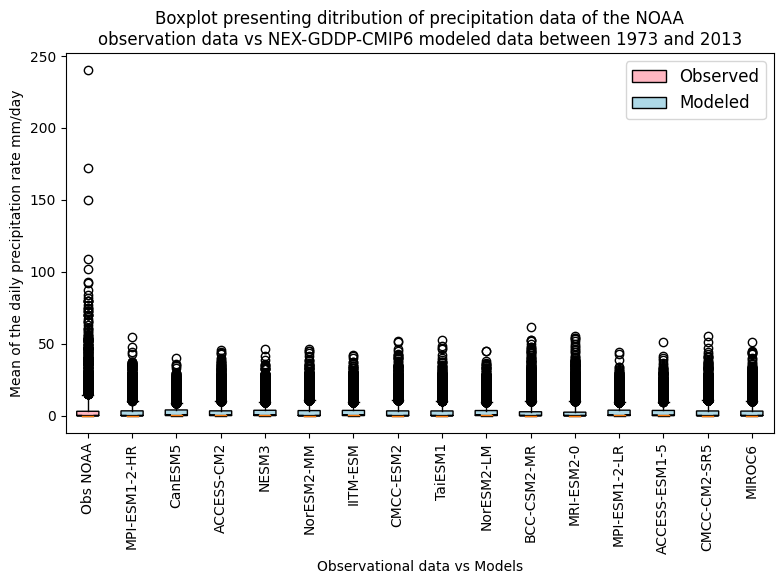

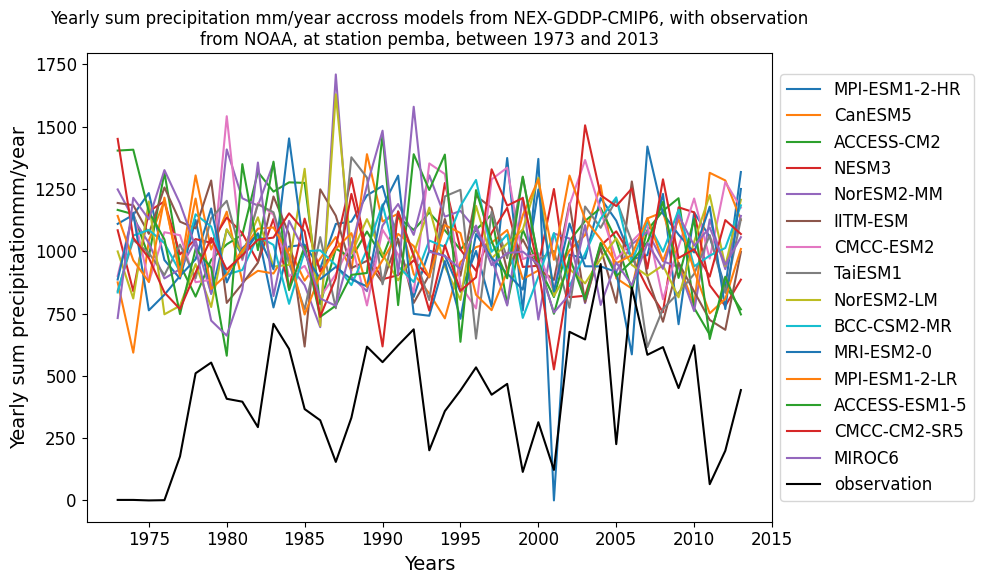

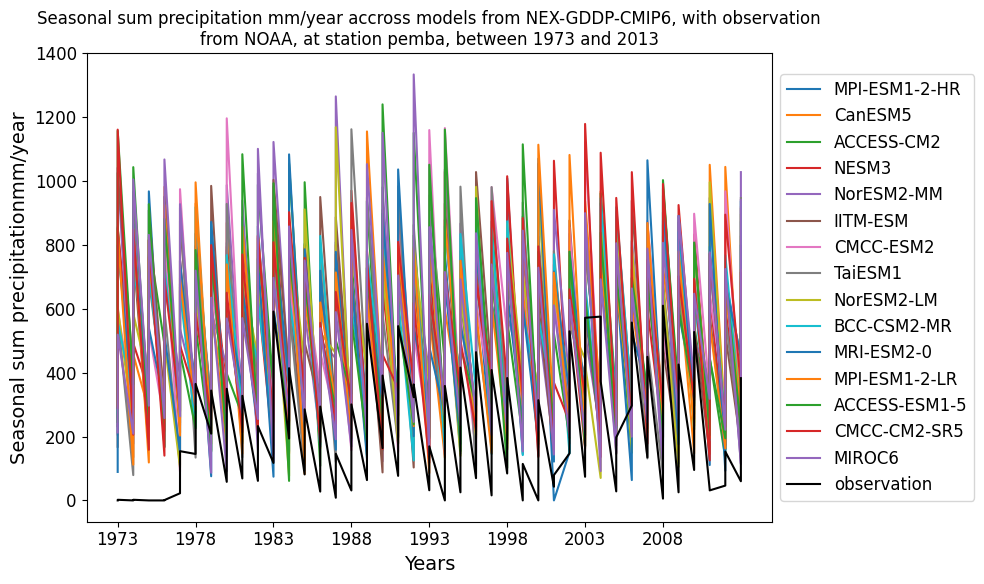

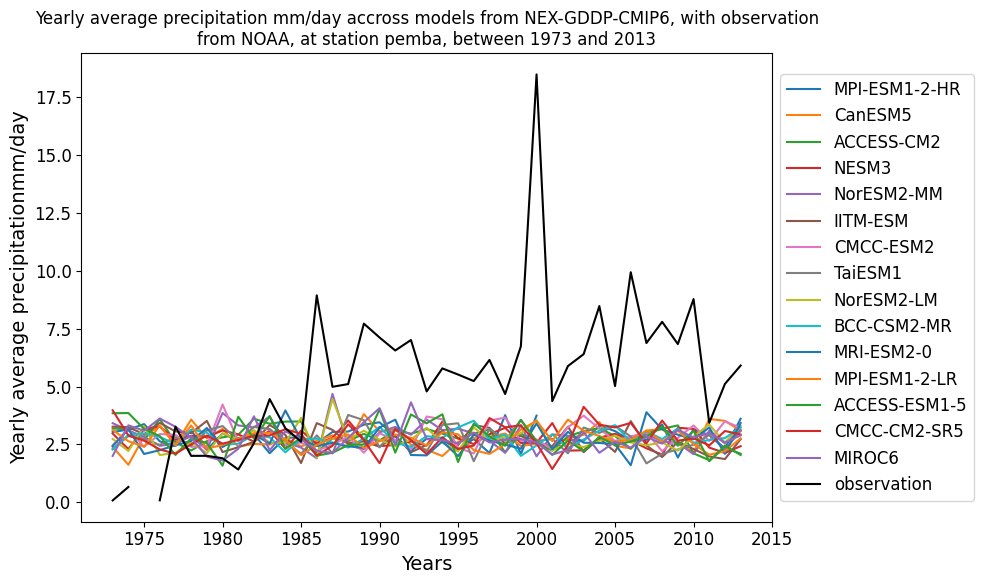

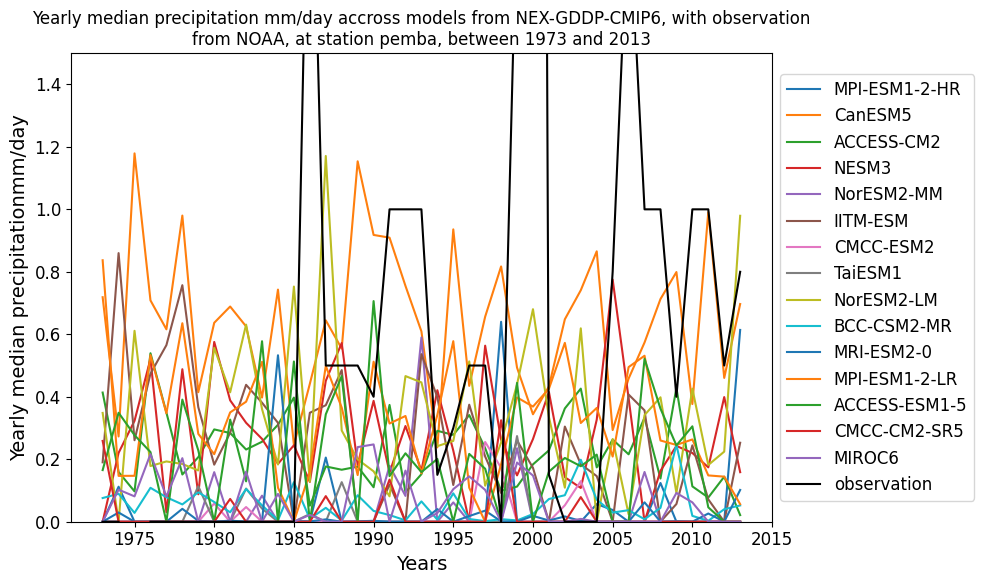

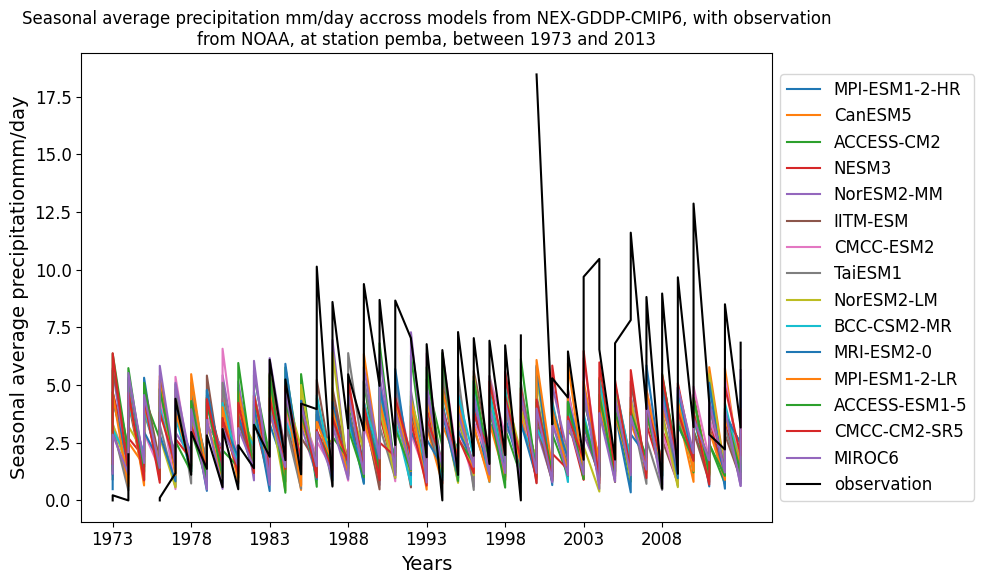

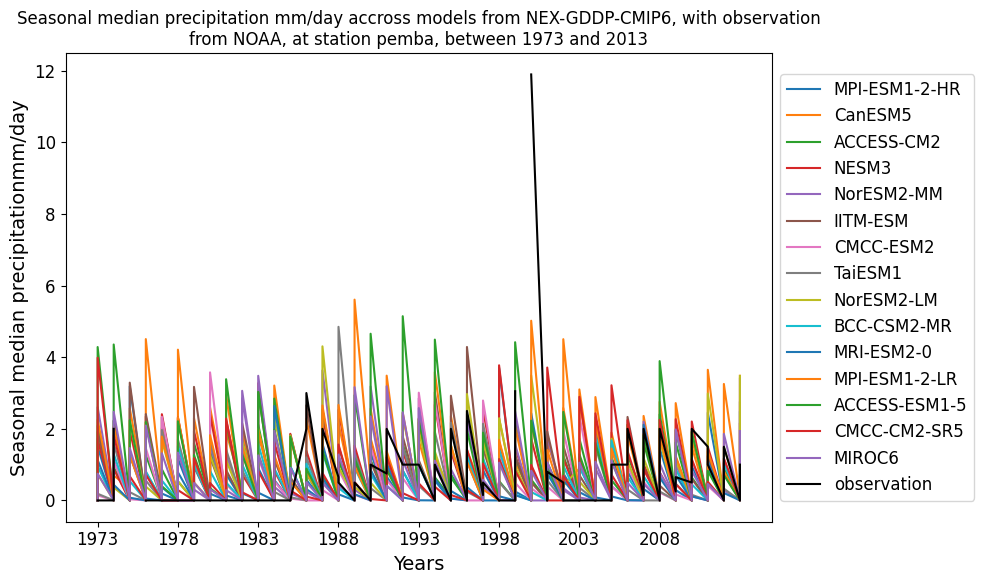

In [25]:
compare_(climate_var,data_obs_NOAA,'PEMBA, MZ')

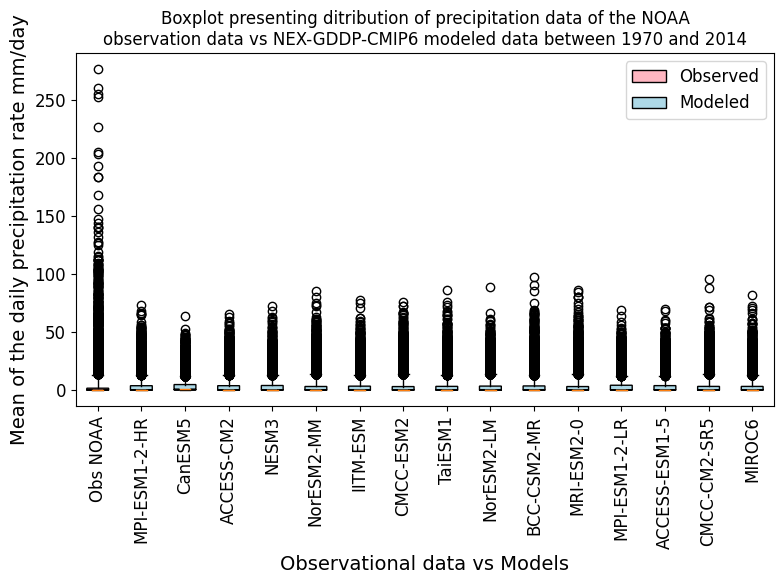

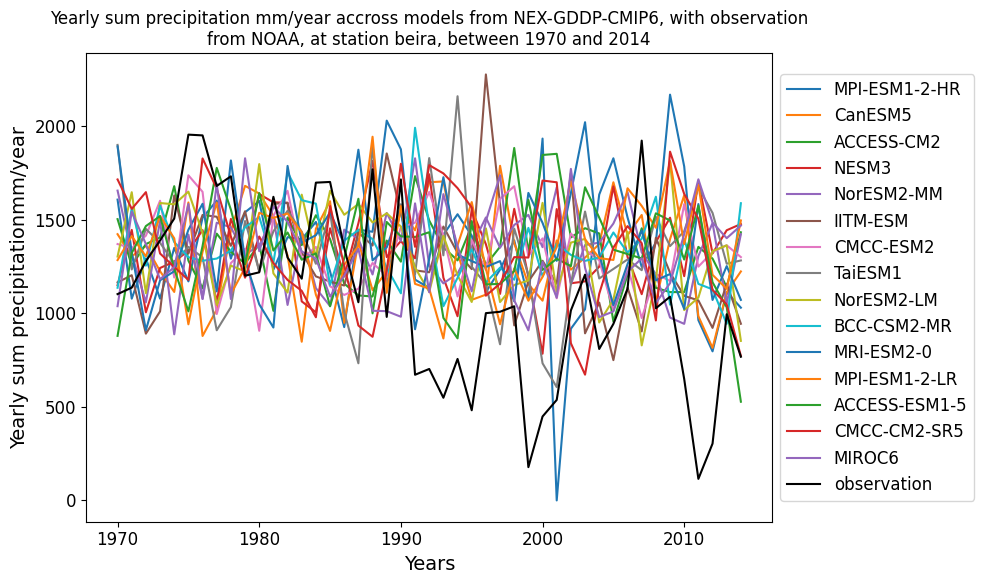

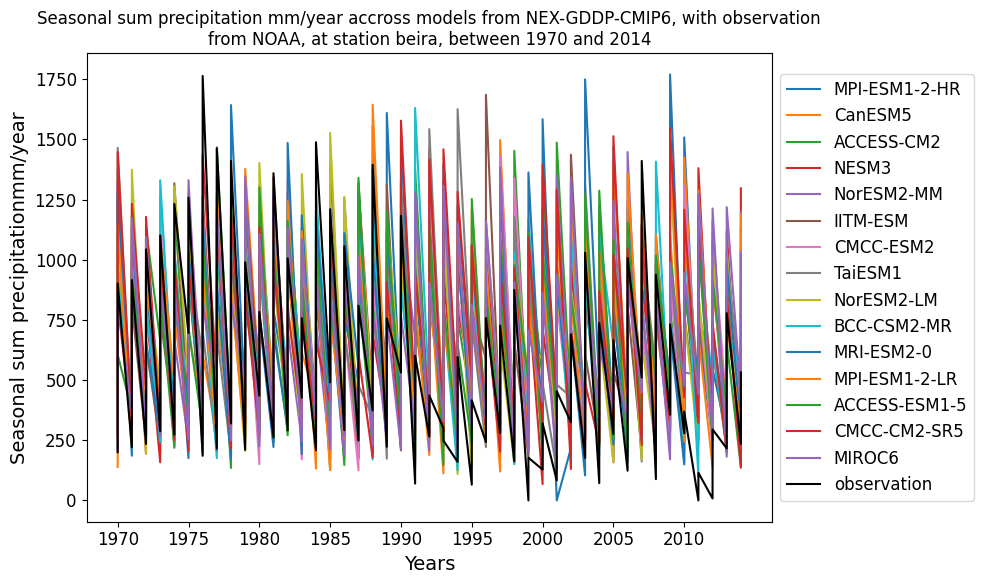

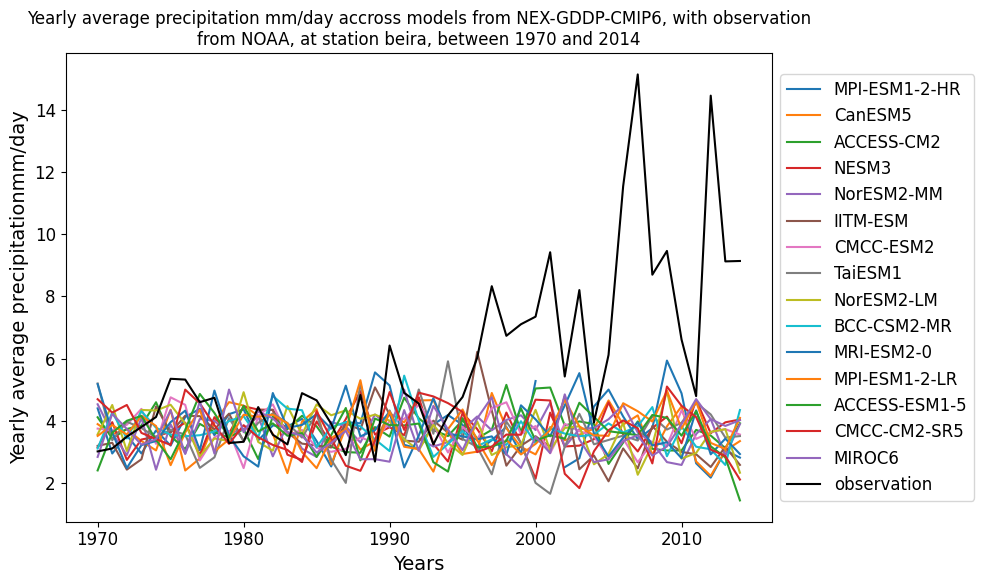

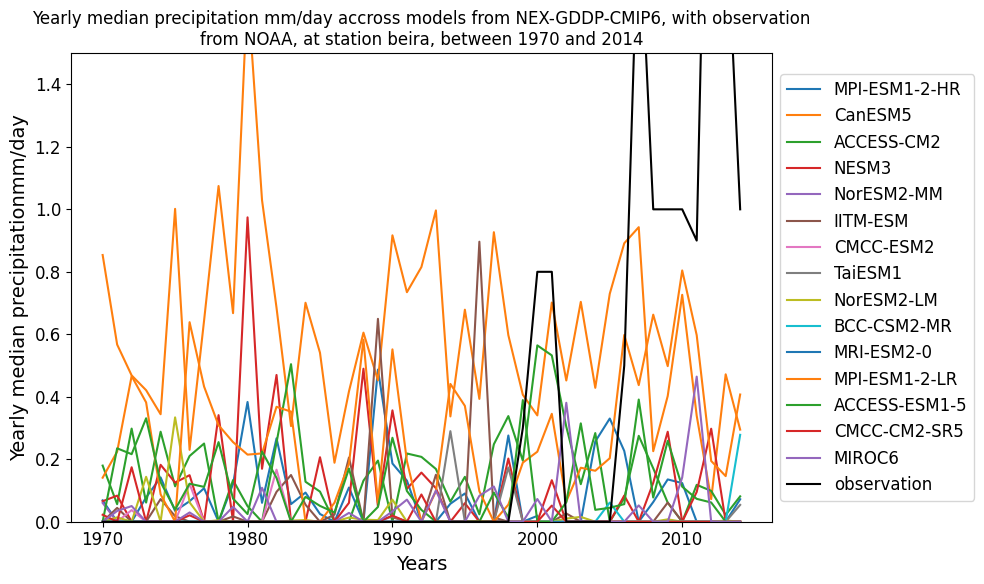

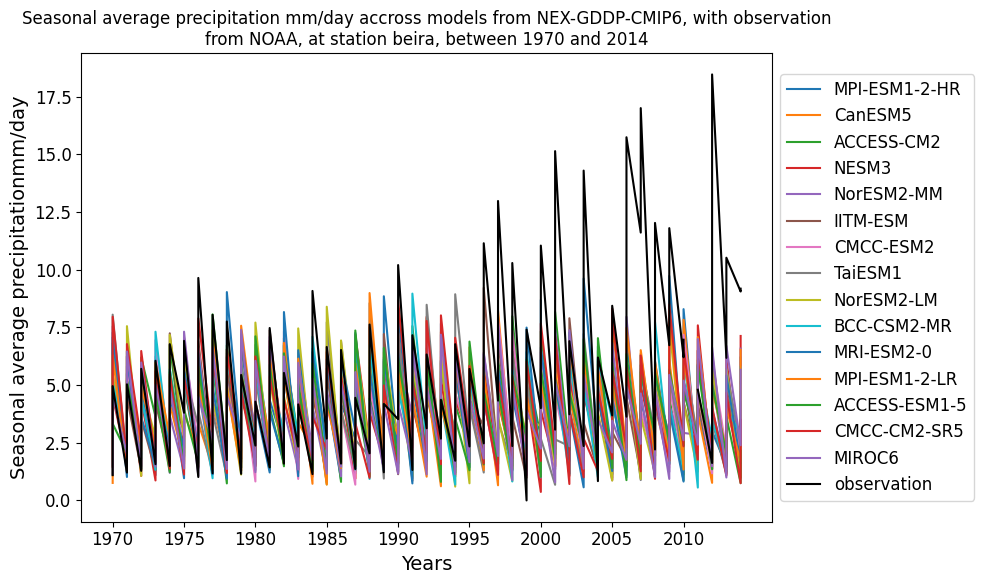

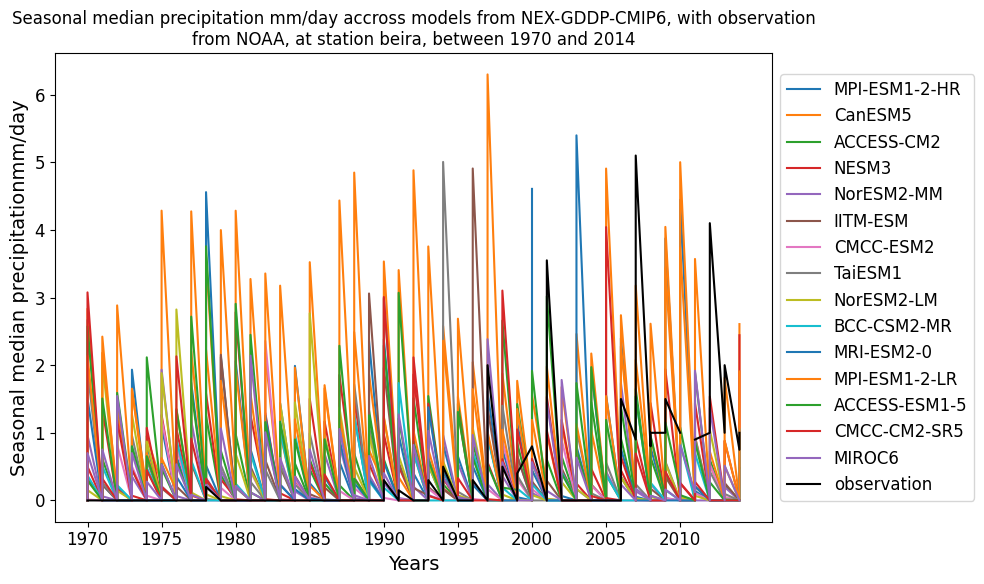

In [26]:
compare_(climate_var,data_obs_NOAA,'BEIRA, MZ')

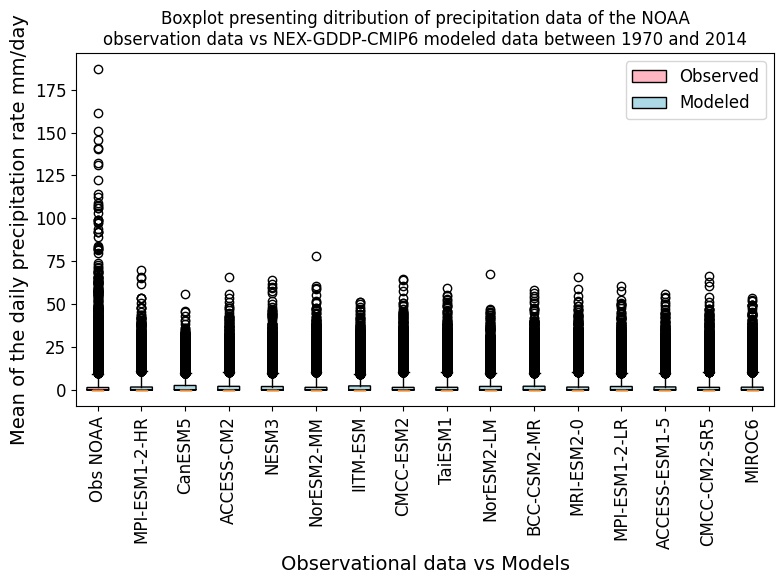

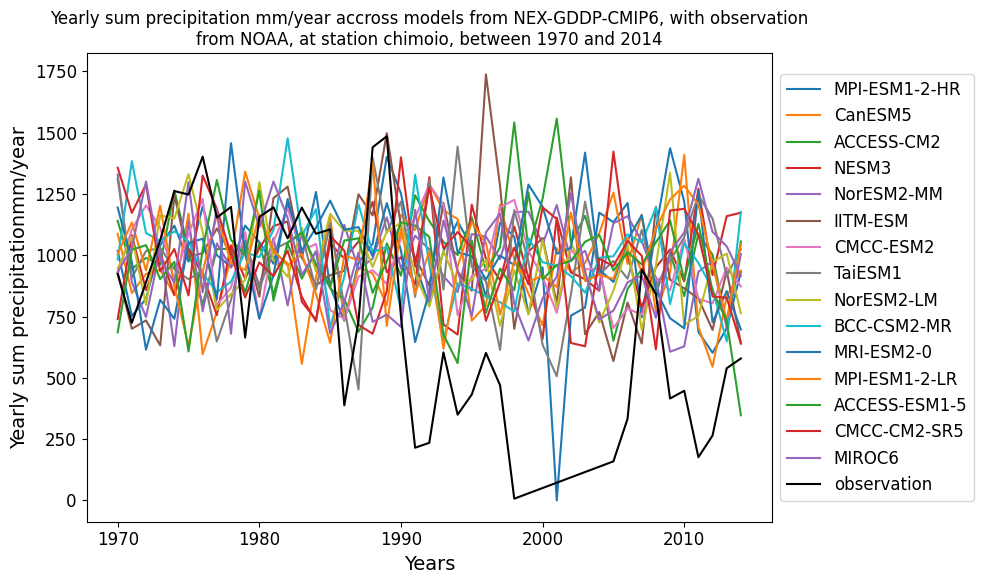

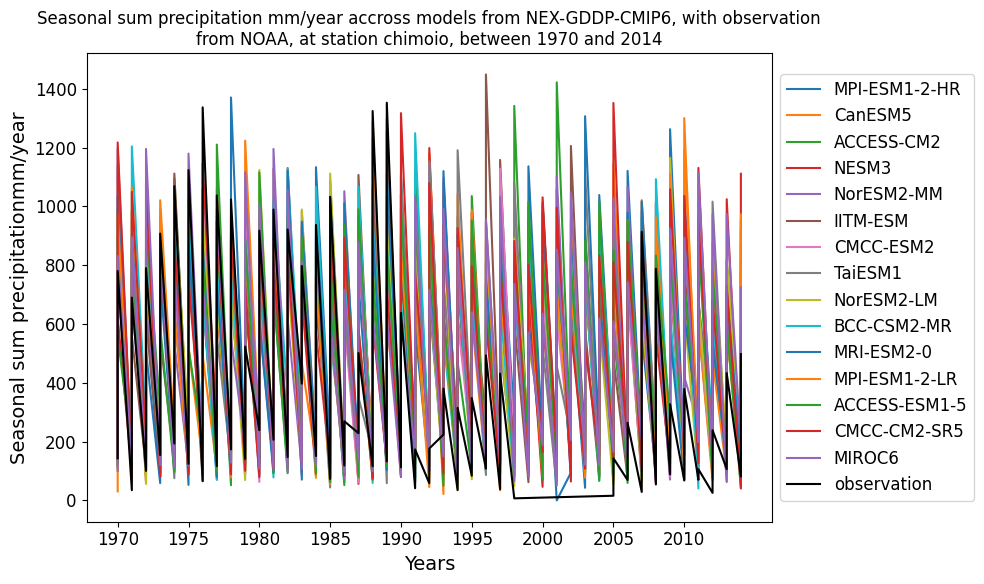

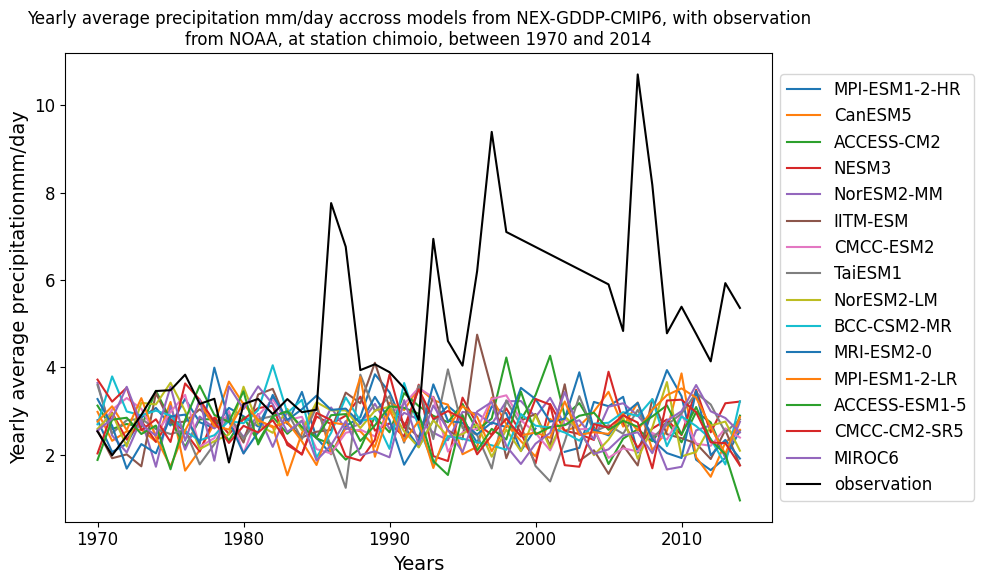

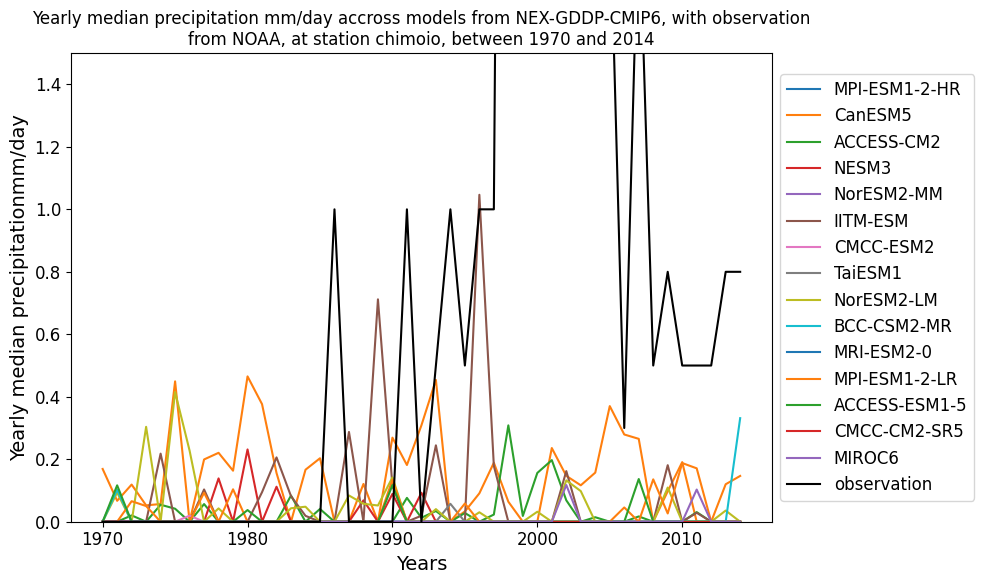

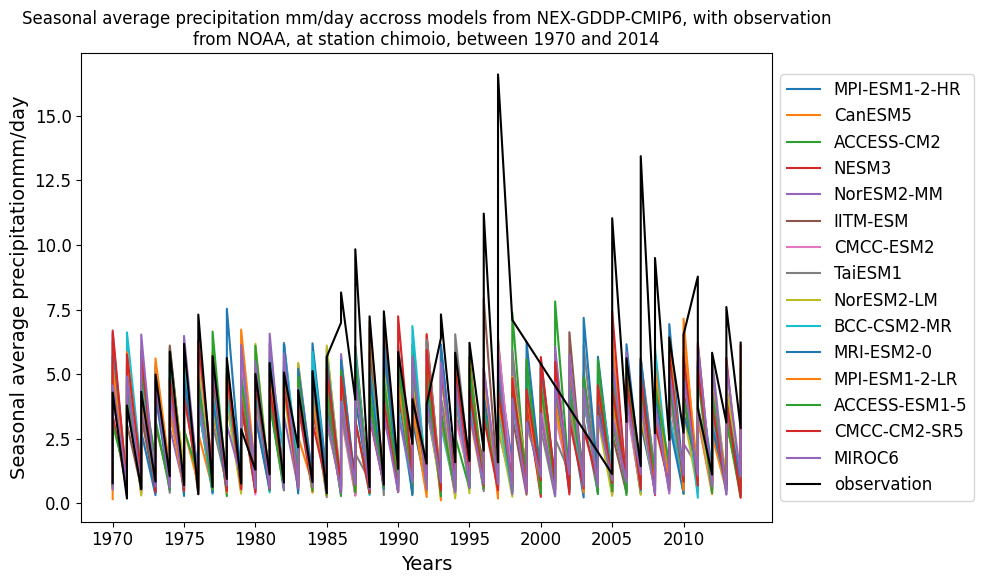

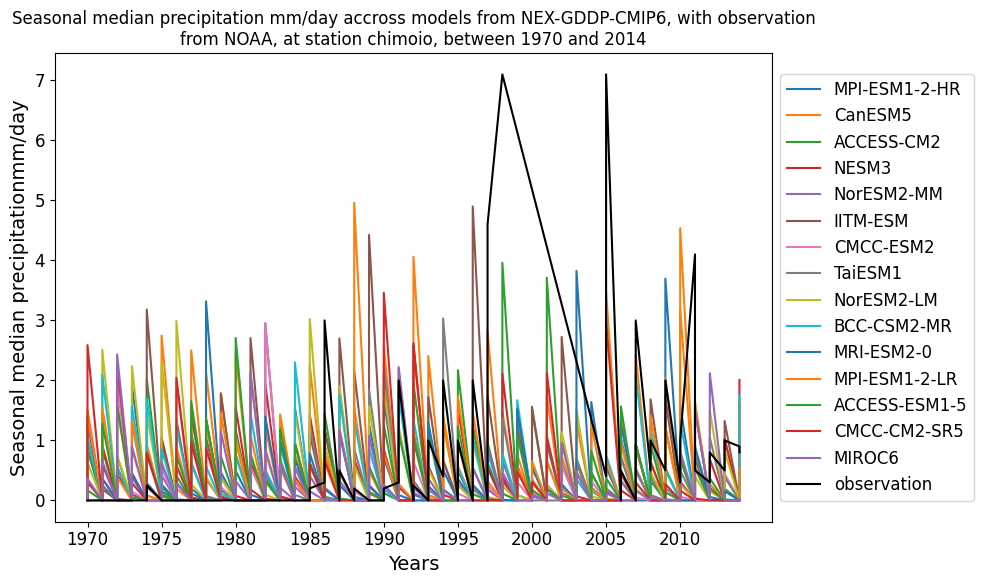

In [27]:
compare_(climate_var,data_obs_NOAA,'CHIMOIO, MZ')

## Compare temperature data for different stations

### Average temperature

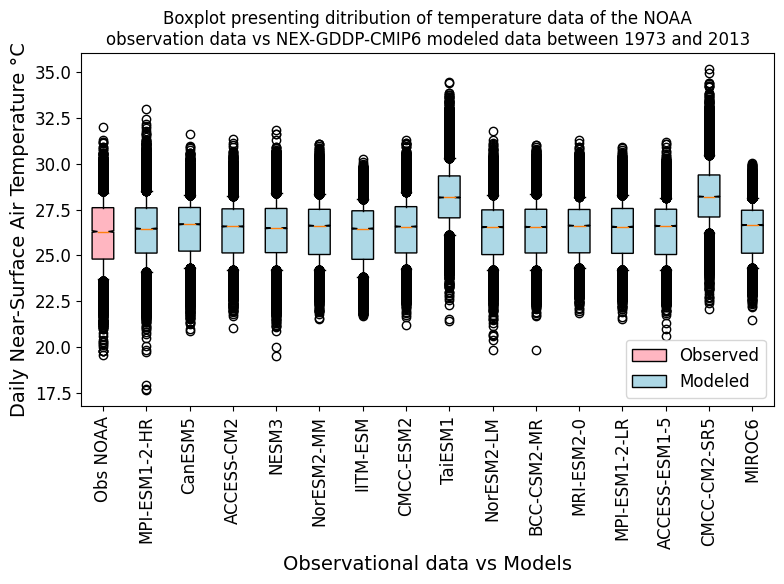

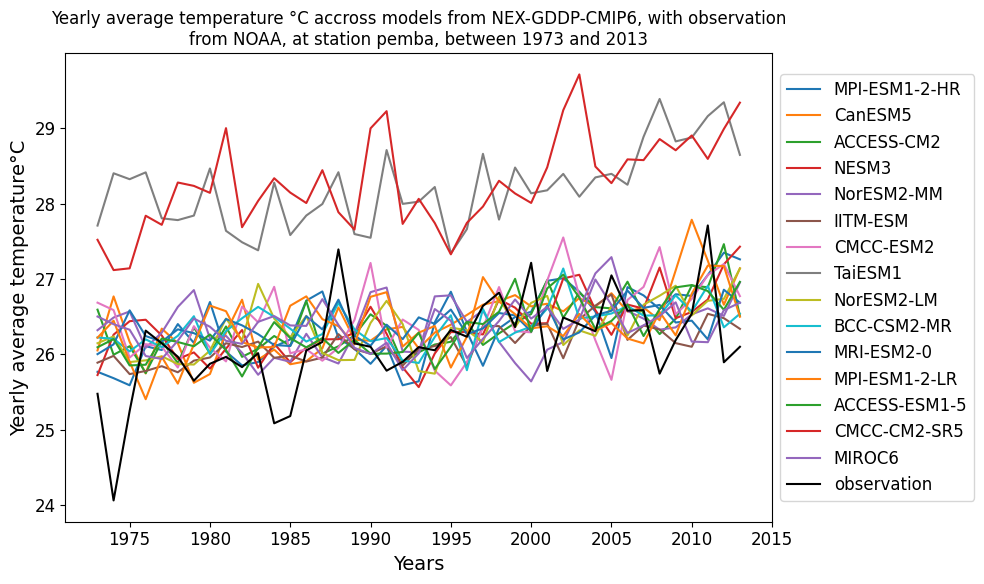

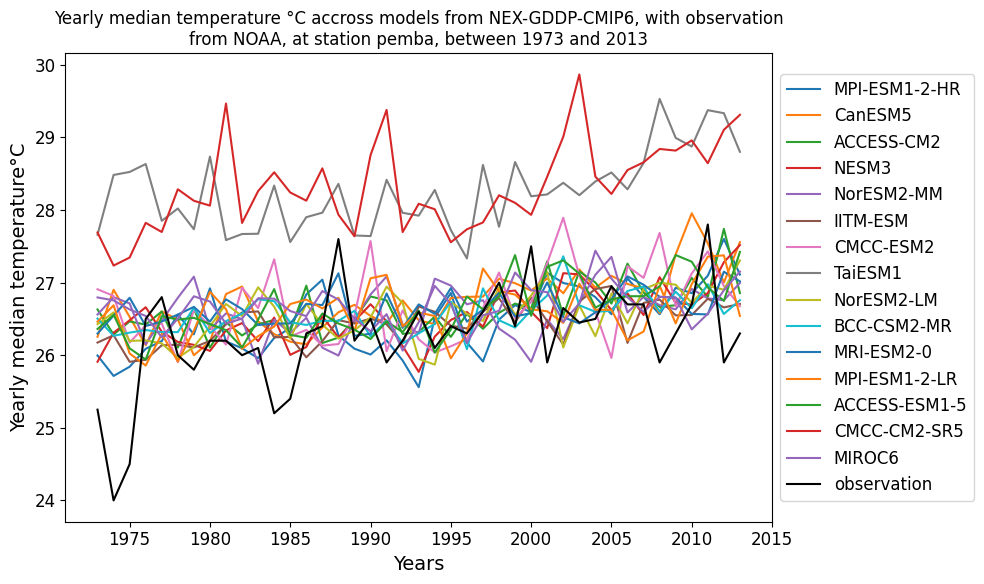

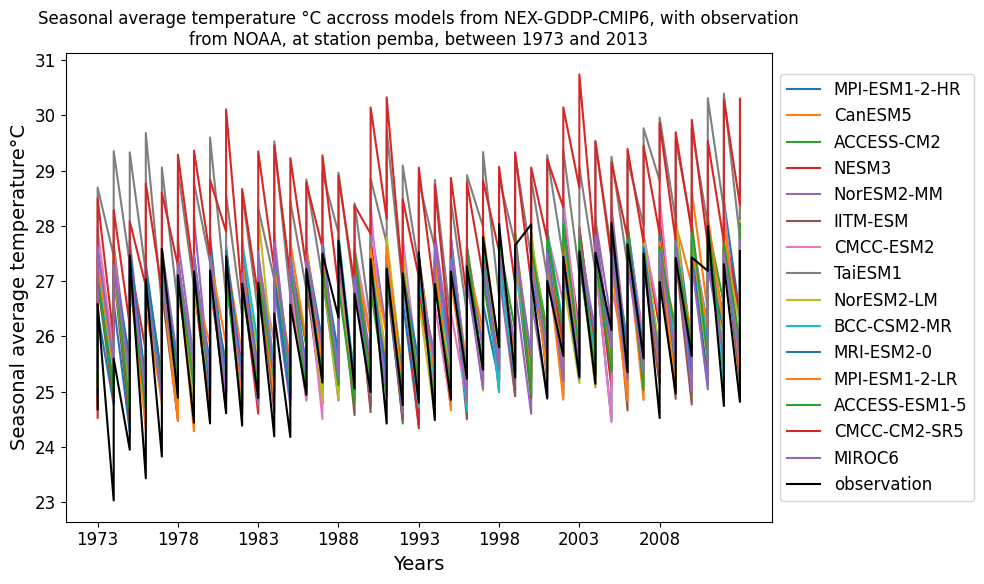

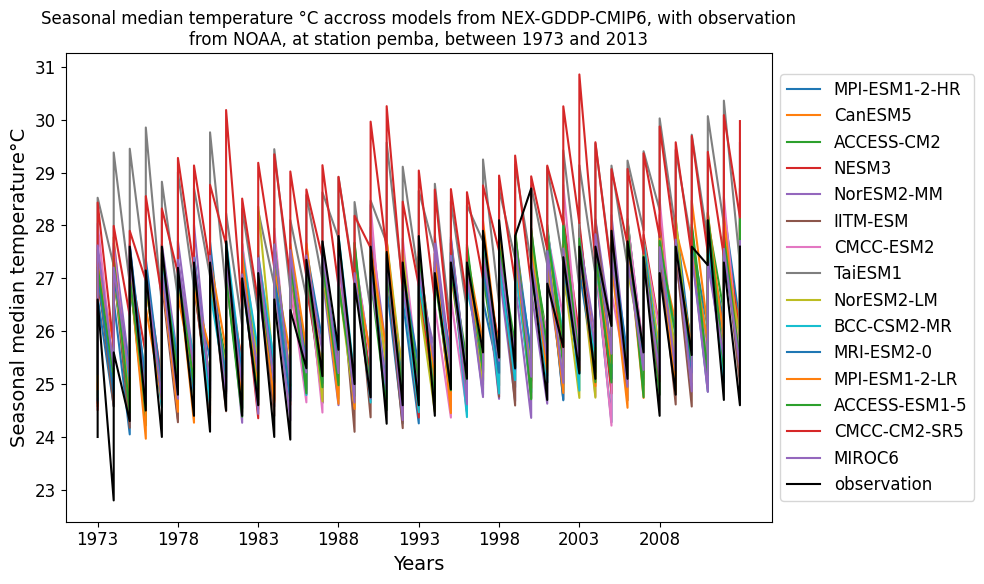

In [28]:
compare_('tas',data_obs_NOAA,'PEMBA, MZ')

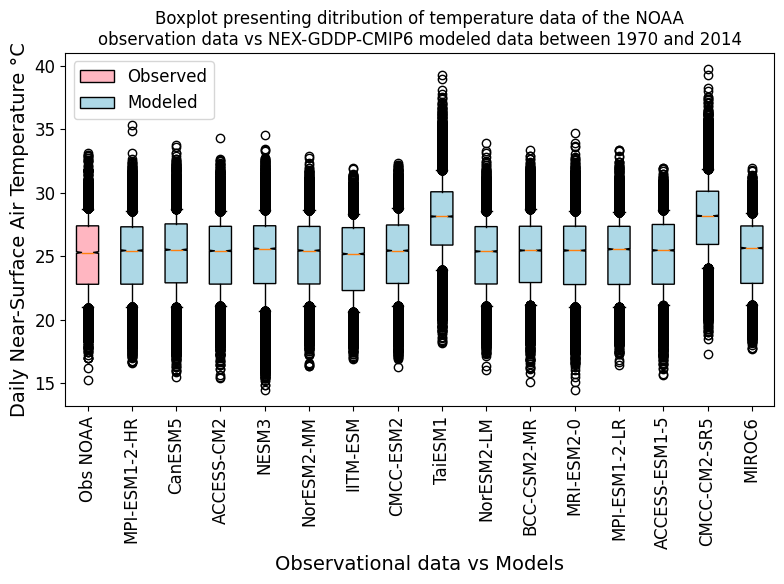

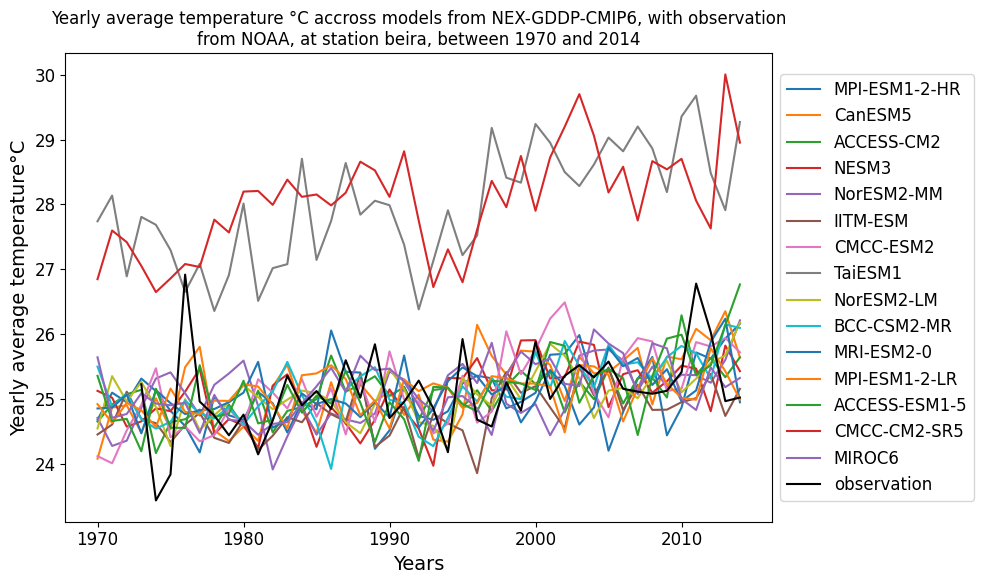

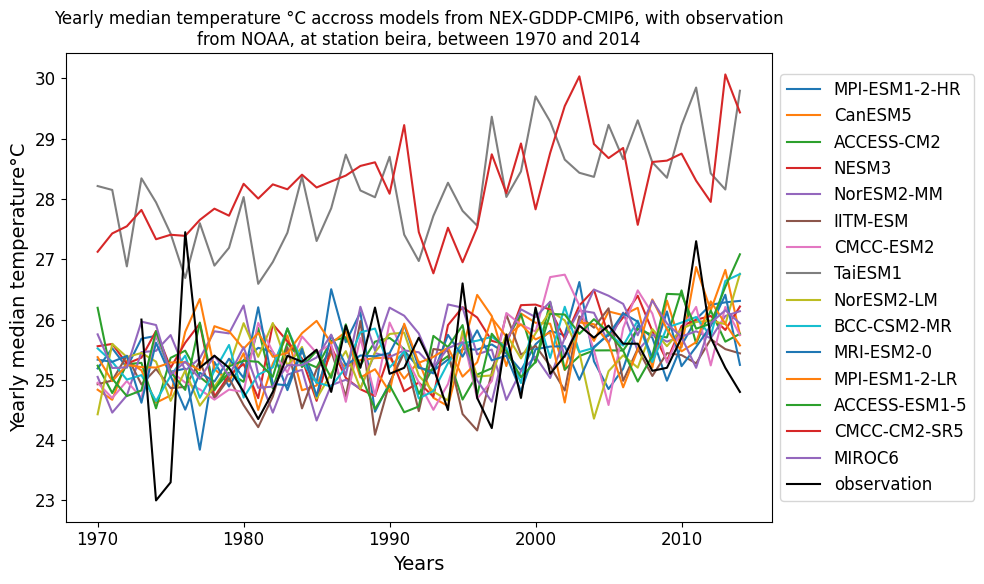

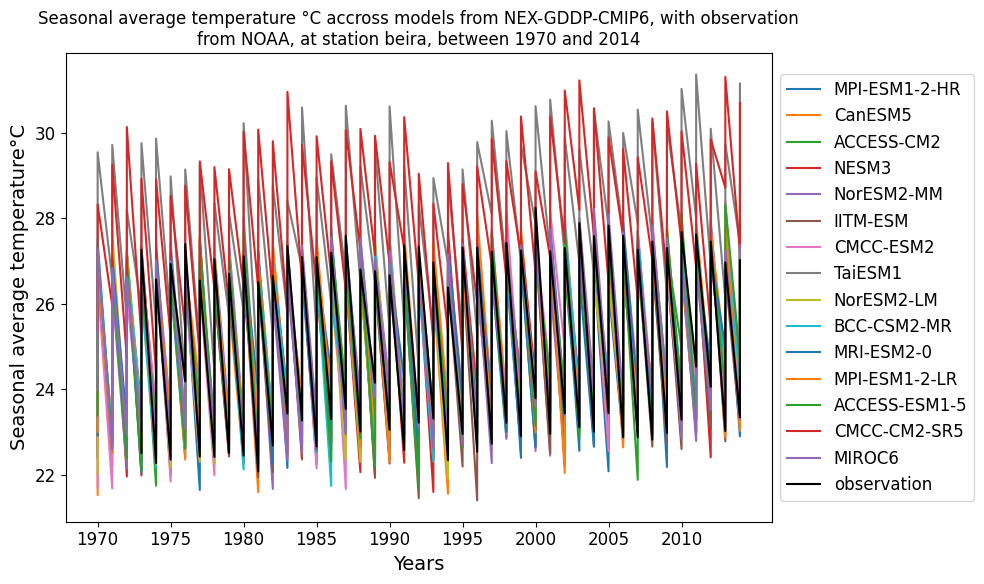

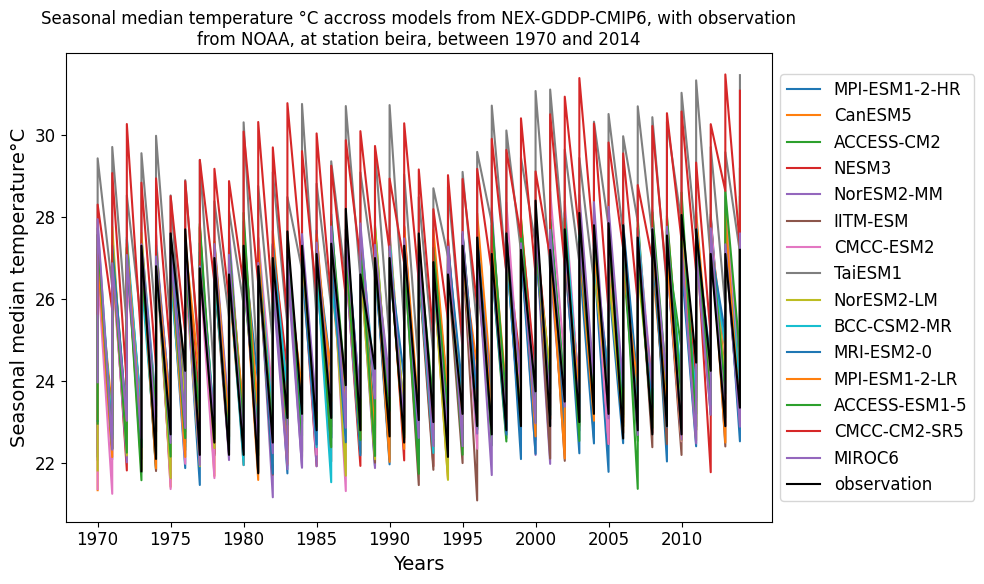

In [29]:
compare_('tas',data_obs_NOAA,'BEIRA, MZ')

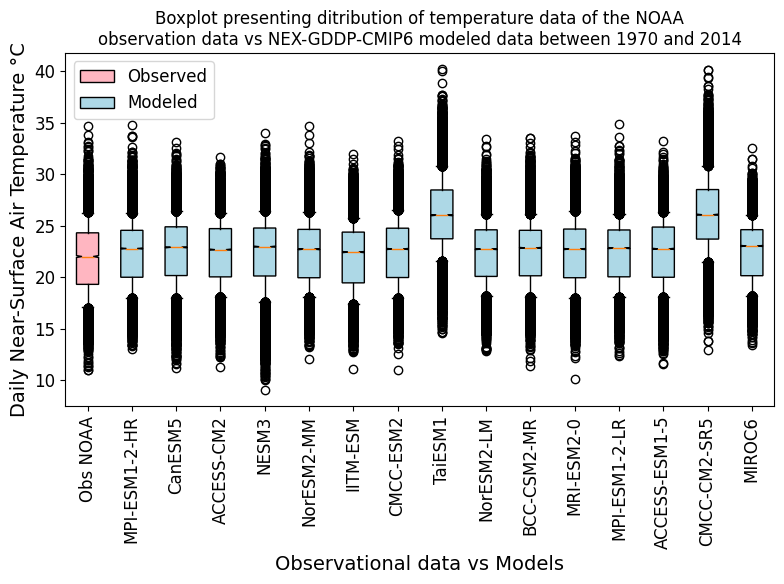

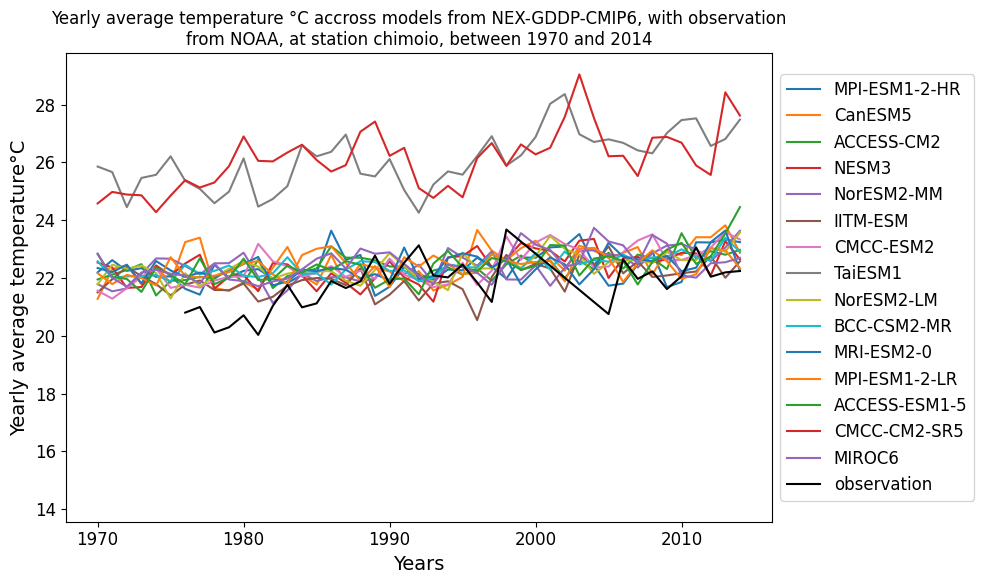

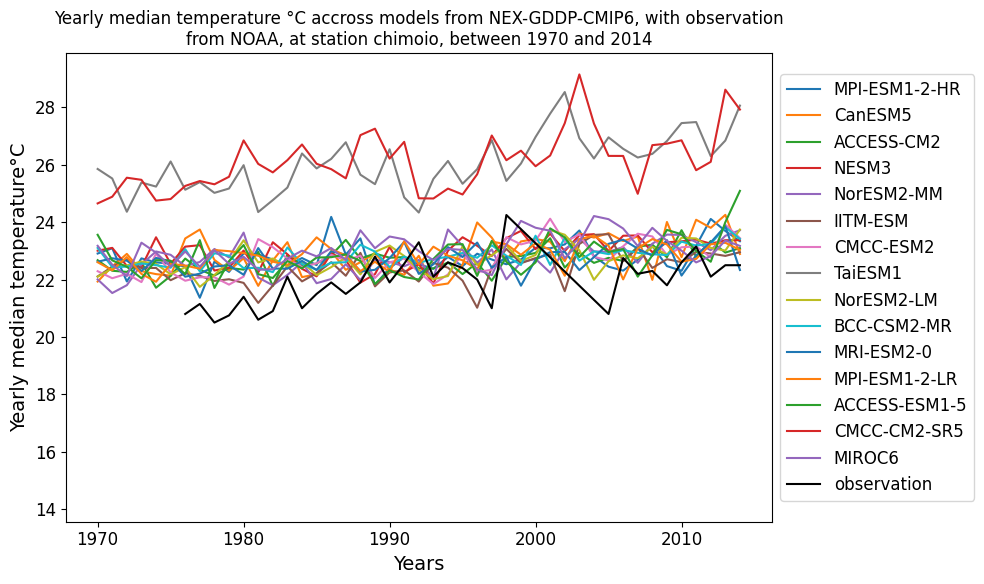

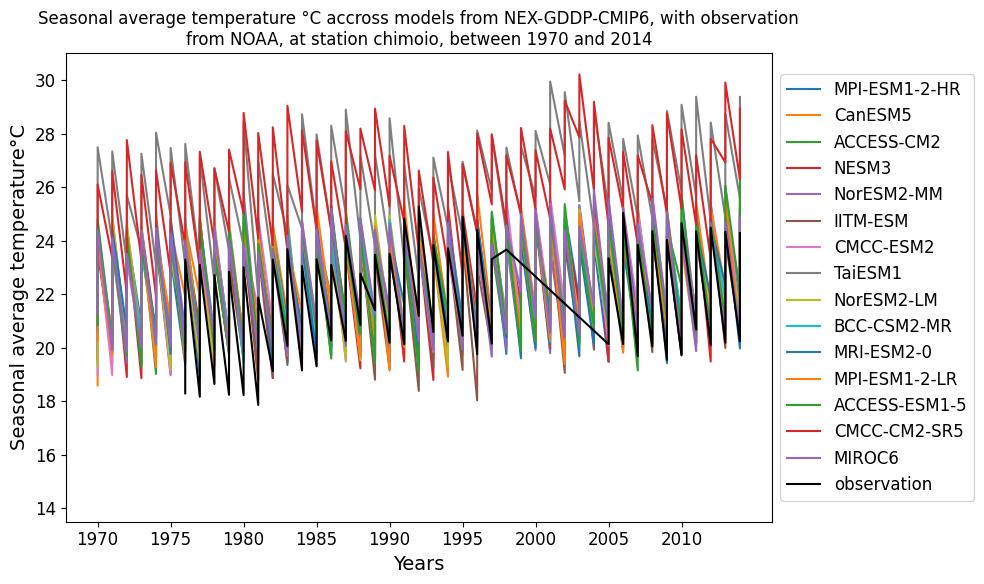

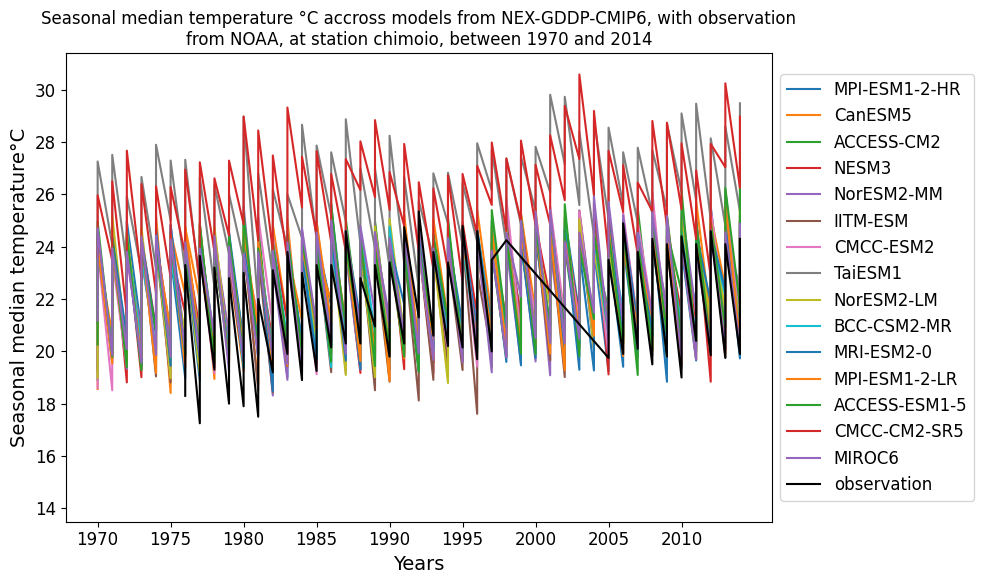

In [30]:
compare_('tas',data_obs_NOAA,'CHIMOIO, MZ')

### Minimum temperature

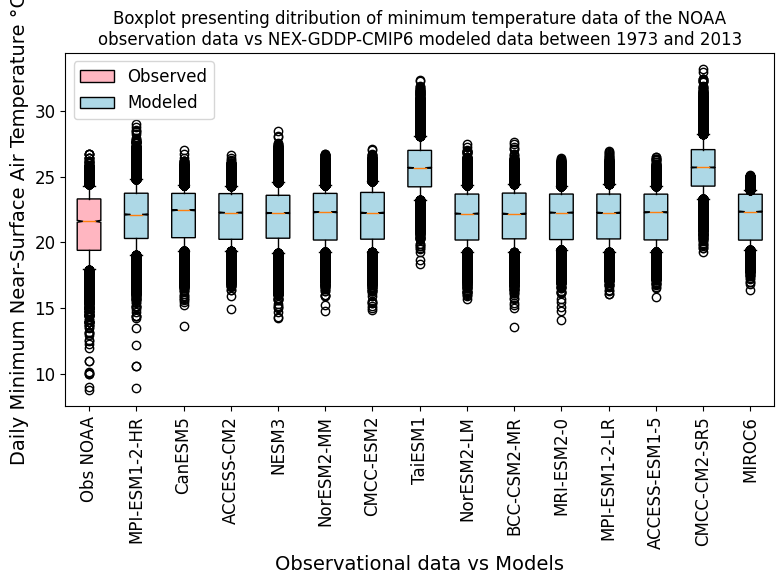

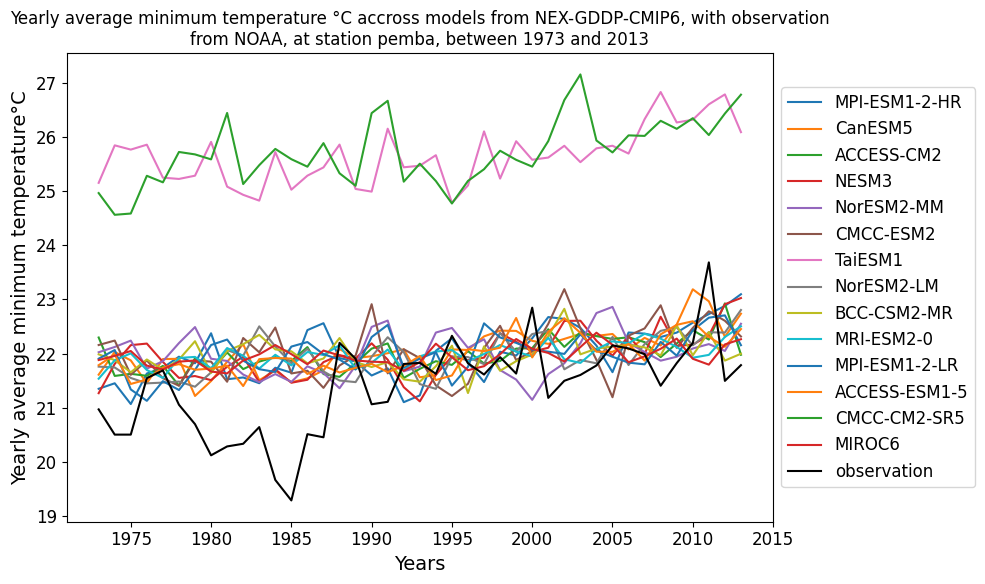

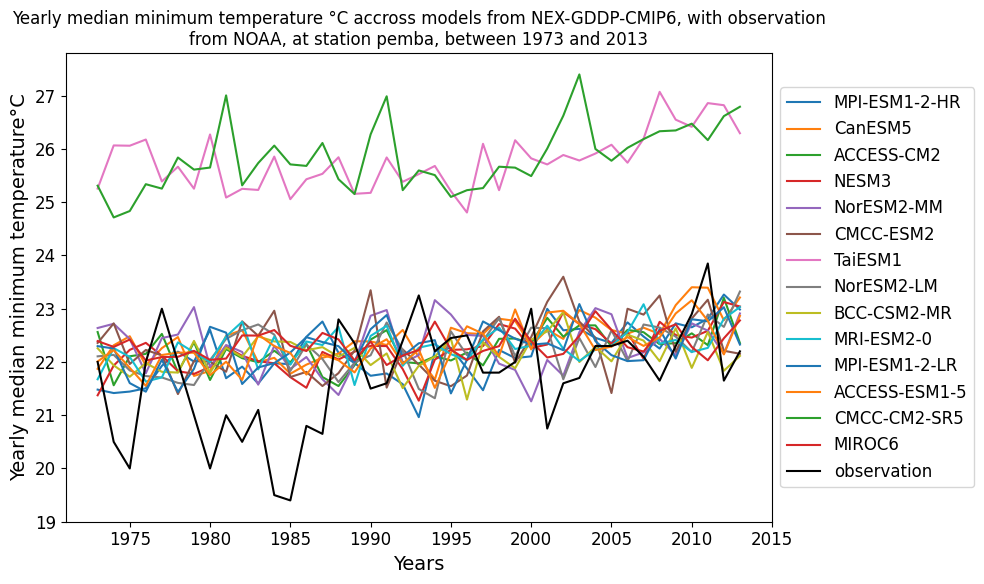

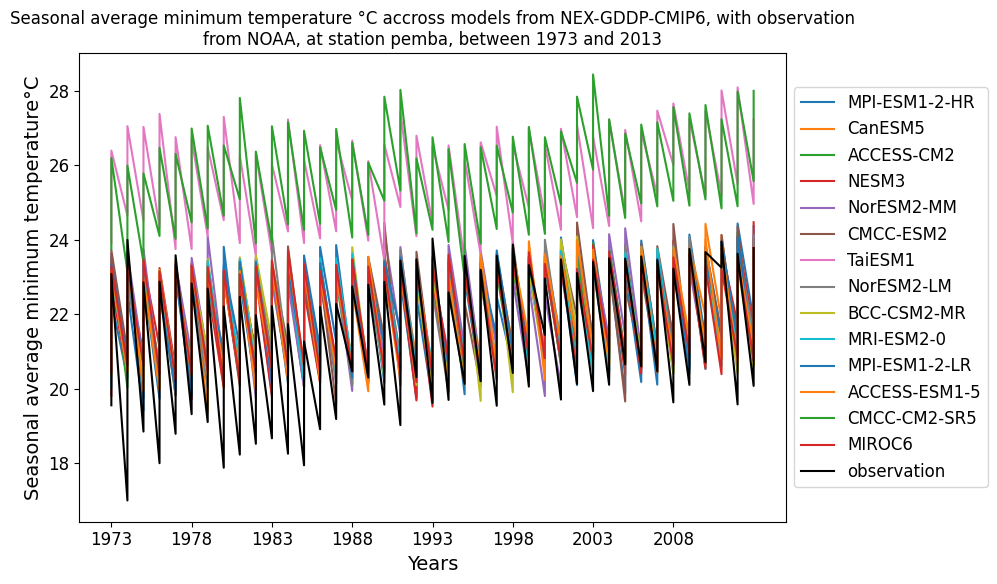

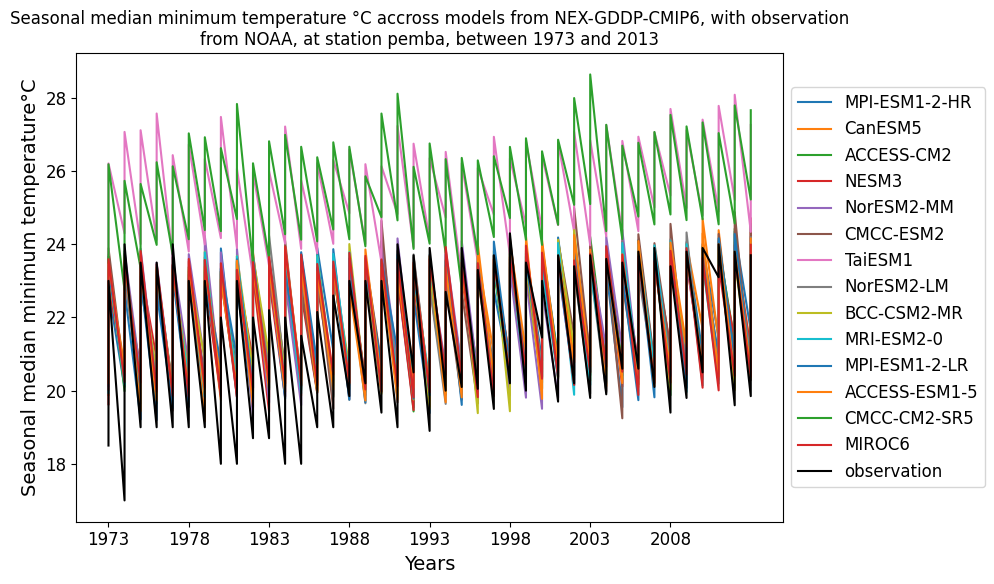

...

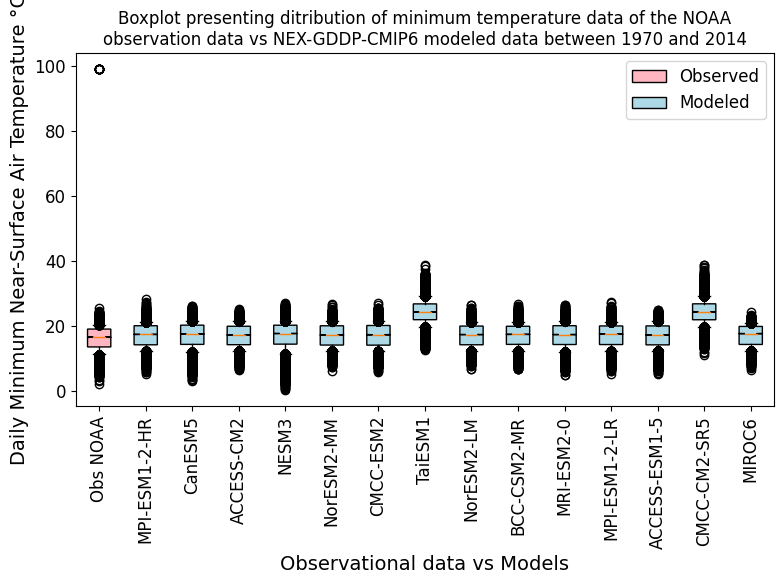

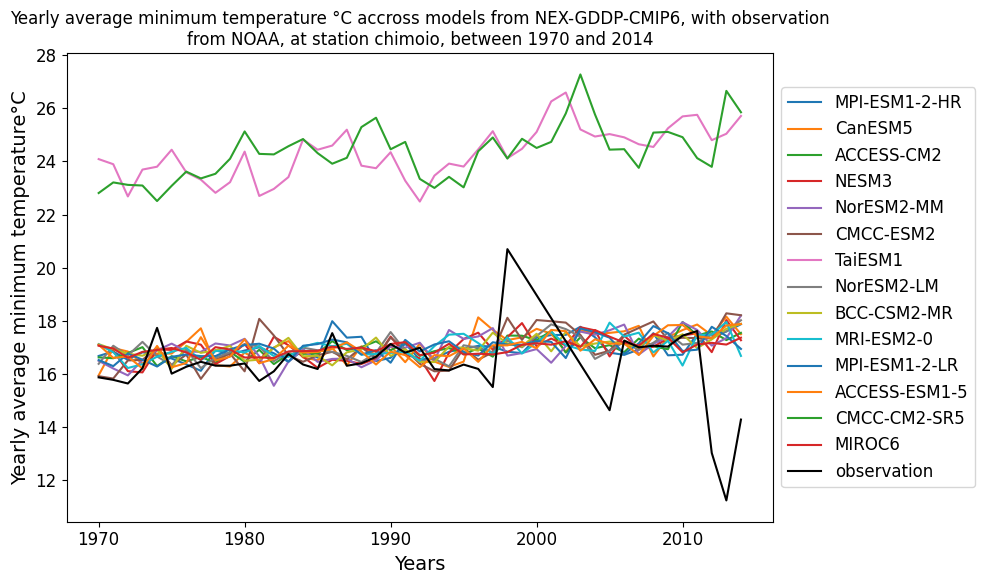

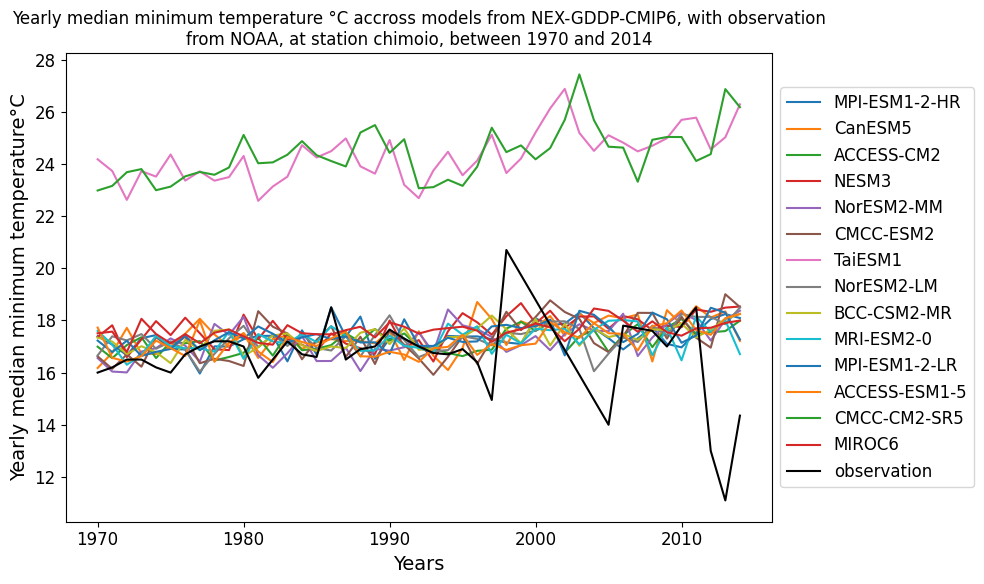

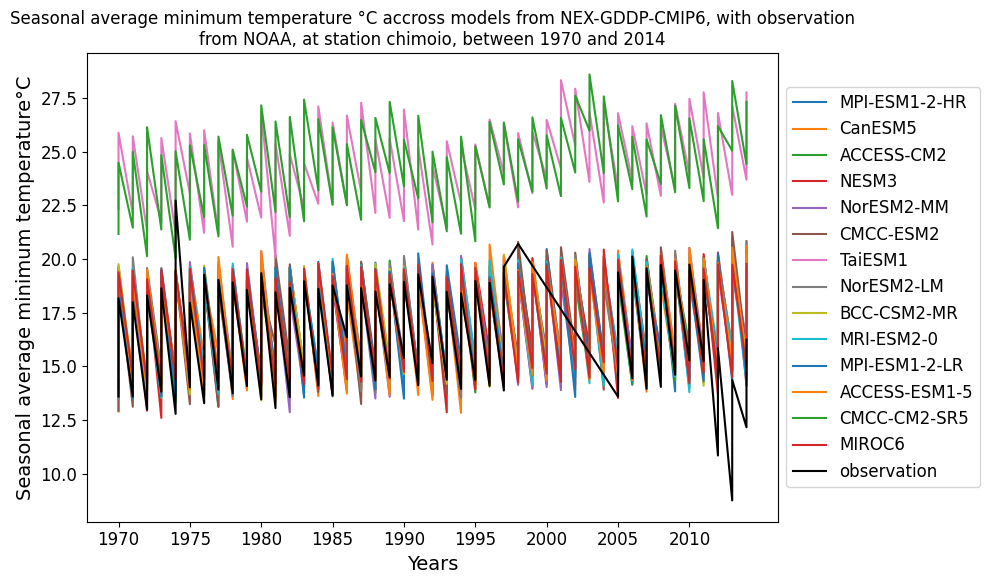

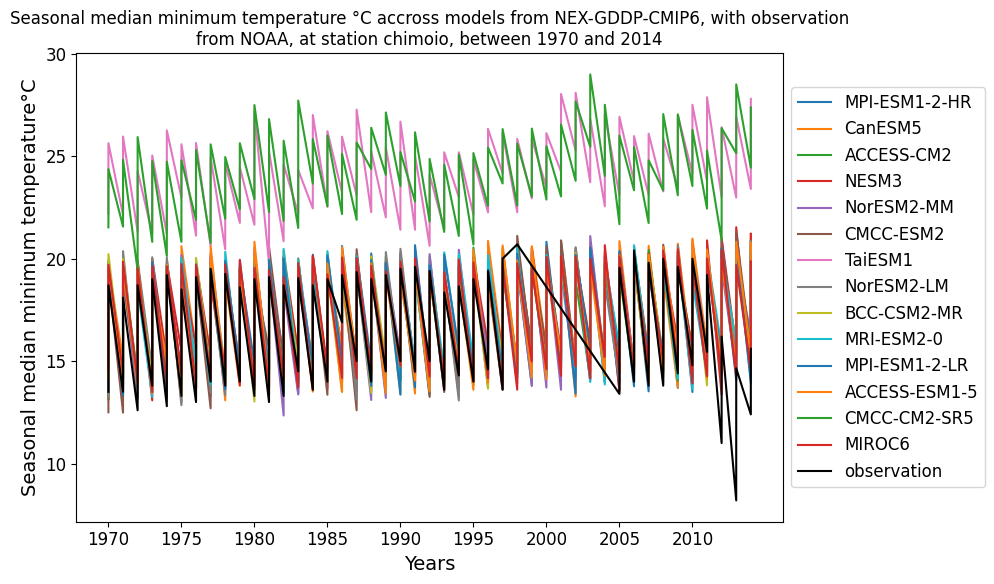

In [31]:
compare_('tasmin',data_obs_NOAA,'PEMBA, MZ')
compare_('tasmin',data_obs_NOAA,'BEIRA, MZ')
compare_('tasmin',data_obs_NOAA,'CHIMOIO, MZ')

### Maximum temperature

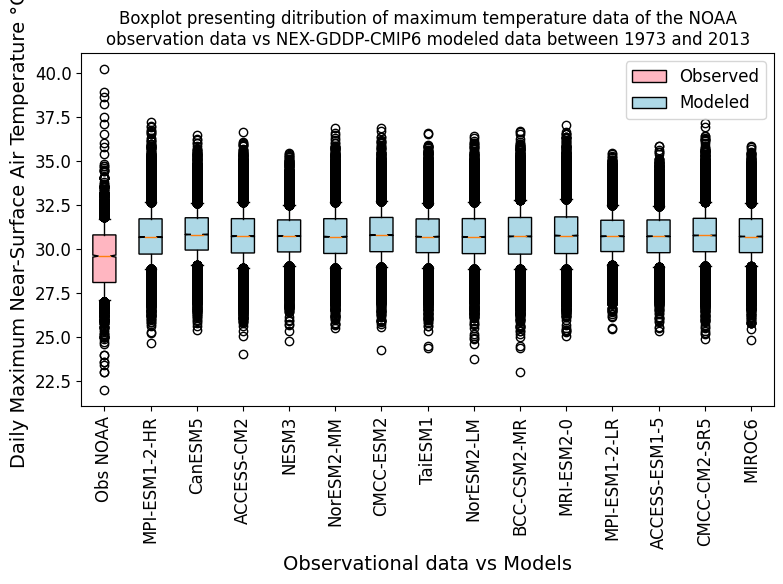

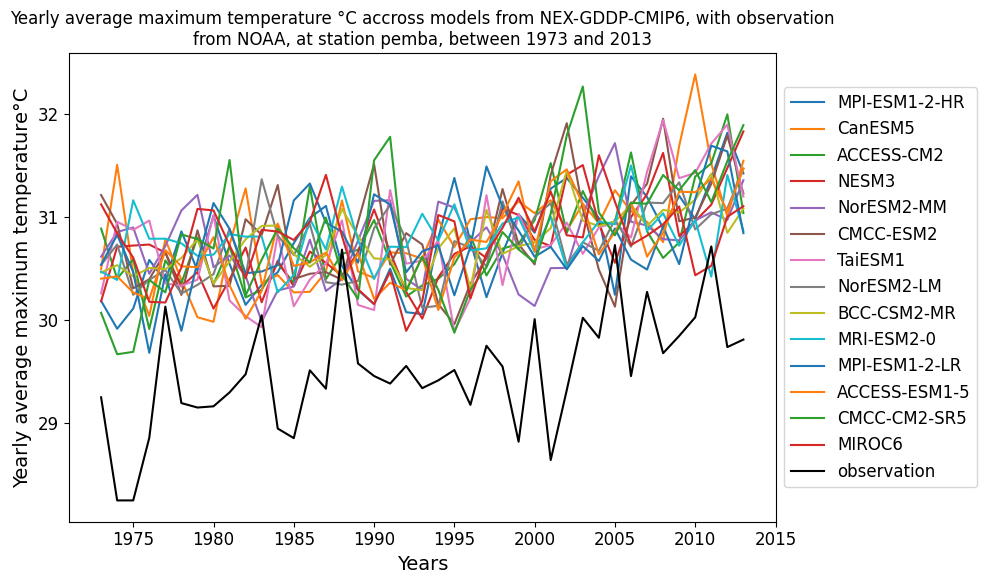

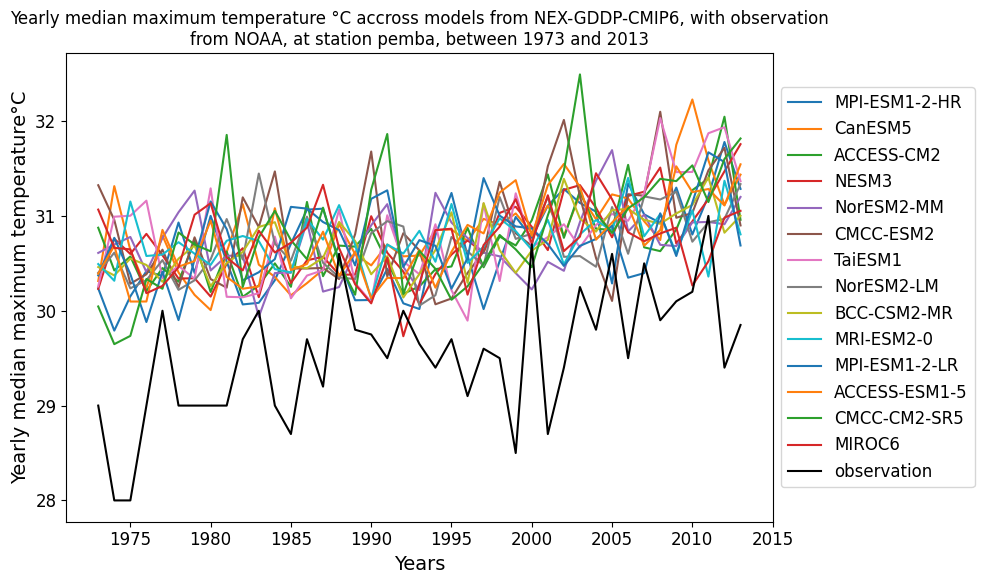

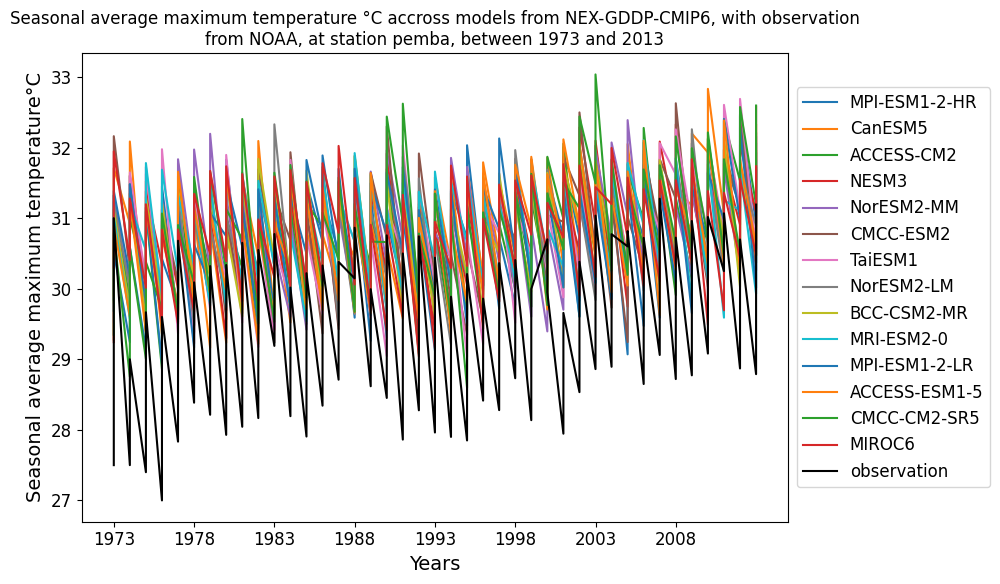

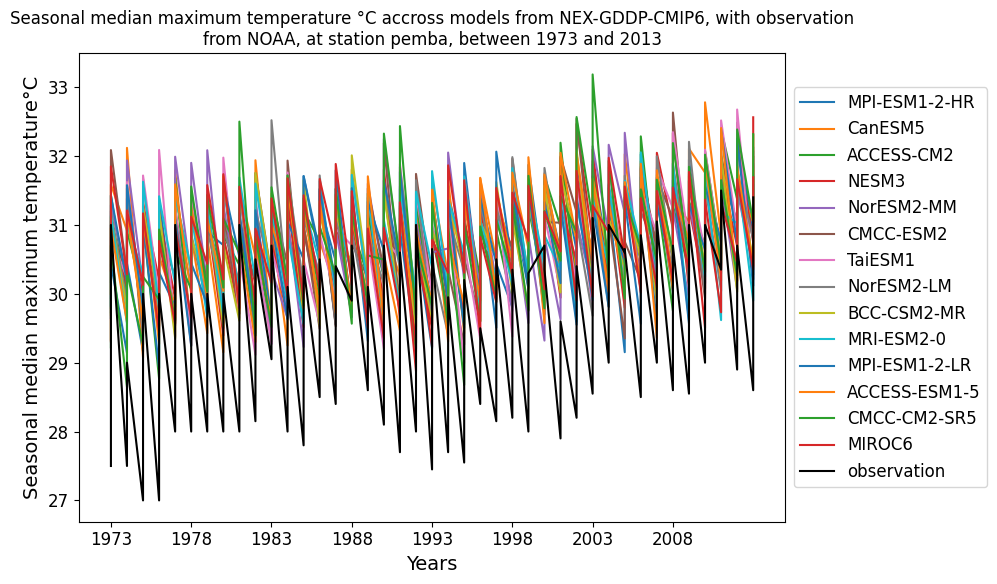

...

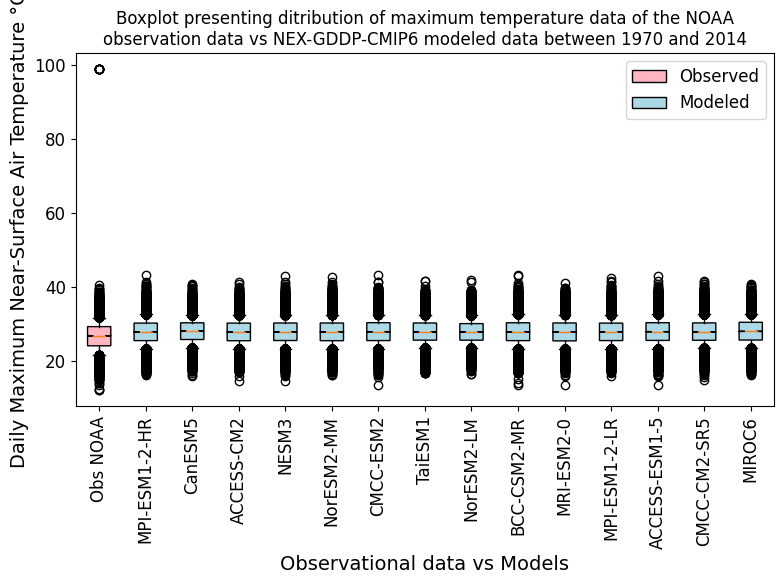

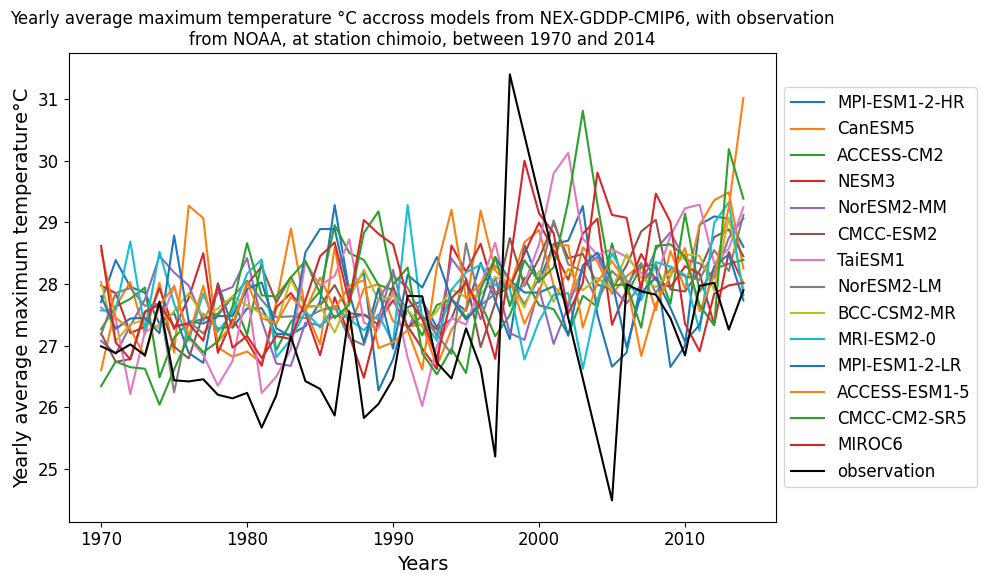

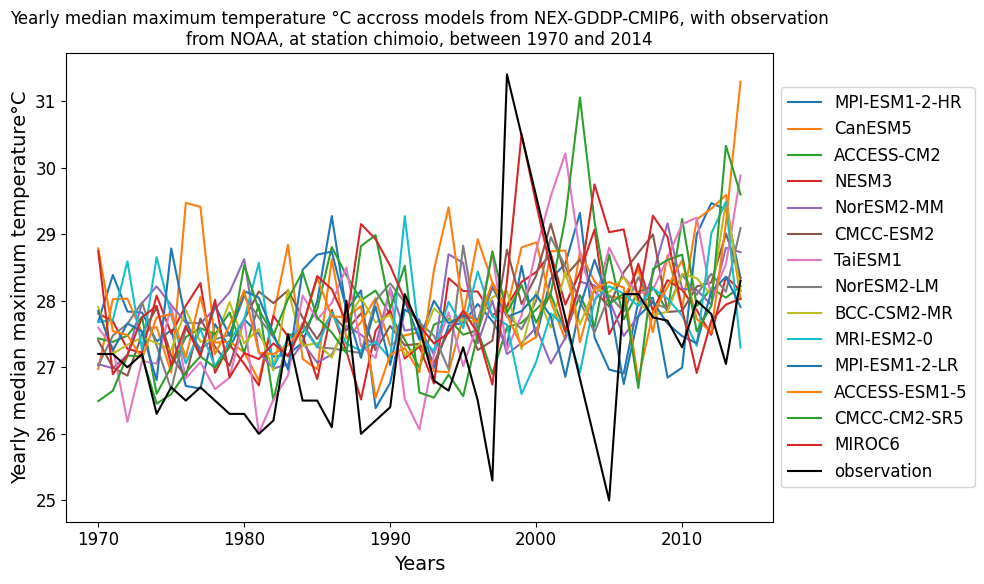

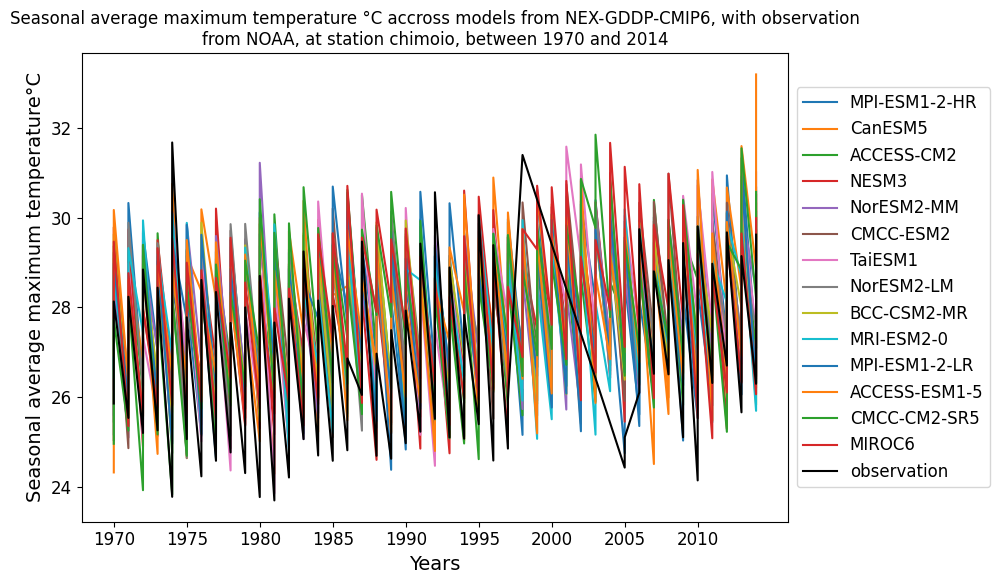

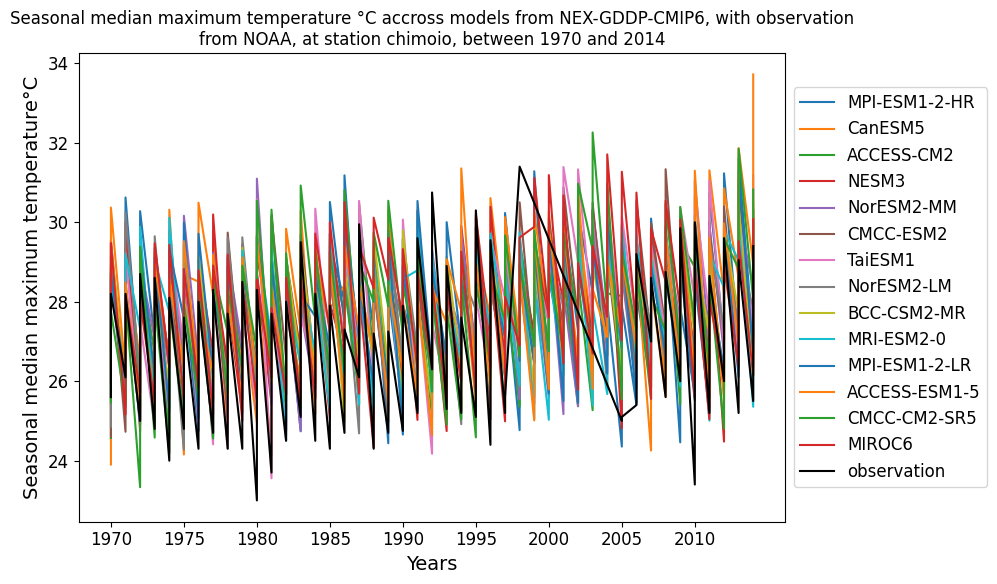

In [32]:
compare_('tasmax',data_obs_NOAA,'PEMBA, MZ')
compare_('tasmax',data_obs_NOAA,'BEIRA, MZ')
compare_('tasmax',data_obs_NOAA,'CHIMOIO, MZ')

# Note concerning distribution of precipitation data
Observational data over this period much bigger than modeled data. However, mediane of all set of data close to 0 --> much more smaller values than big values

# BIAS CORRECTION - POINT WISE METHOD

[Scikit-downscale](https://github.com/pangeo-data/scikit-downscale/tree/main)
[Detailed process here](https://github.com/pangeo-data/scikit-downscale/blob/main/examples/2020ECAHM-scikit-downscale.ipynb)

In [33]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")  # sklearn

import matplotlib.pyplot as plt
import seaborn as sns

import pandas as pd

#from utils import get_sample_data

sns.set(style='darkgrid')

In [34]:
# prepare set of data for Bias correction
# load sample data

In [35]:
# training
climate_var_NEX_GDDP_CMIP6_EmplacementStation_BC=climate_var_NEX_GDDP_CMIP6_EmplacementStation[climate_var_NEX_GDDP_CMIP6_EmplacementStation['Name station']==name_station].drop(['Name station','Year','Month','Season'],axis =1)
climate_var_NEX_GDDP_CMIP6_EmplacementStation_BC_model = climate_var_NEX_GDDP_CMIP6_EmplacementStation_BC[climate_var_NEX_GDDP_CMIP6_EmplacementStation_BC['Model'] =='ACCESS-CM2'].drop(['Model'],axis=1)
training = climate_var_NEX_GDDP_CMIP6_EmplacementStation_BC_model.rename(columns = {'Date':'time','Mean of the daily precipitation rate mm/day':'pcp'}).reset_index()

# changing format of Date for training
Date1 = training['time'].values
for i in np.arange(0,len(training)):
    training['time'][i] = Date1[i][6:10]+'-'+Date1[i][3:5]+'-'+Date1[i][0:2]#datetime.strptime(, '%Y-%M-%d').date()
    print(training['time'][i])
# .date() to avoid having the hours in the datetime
training=training.set_index('time').drop(['index'],axis=1)


# targets
targets = data_obs_NOAA[['NAME','DATE','PRCP']] # select only 3 columns of interest
targets = targets[targets['NAME']==name_station].rename(columns = {'DATE':'time','PRCP':'pcp'}).set_index('time').drop(['NAME'],axis=1) # the targets data is meant to represent our "observations"


# to have the same size of vectors
targets = targets.dropna() # drop rows with NaN
training = training[training.index.isin(list(targets.index))] # drop rows of training where date is equal to date where there is no value for target

1970-01-01
1970-01-02
1970-01-03
1970-01-04
1970-01-05
1970-01-06
1970-01-07
1970-01-08
1970-01-09
1970-01-10
1970-01-11
1970-01-12
1970-01-13
1970-01-14
1970-01-15
1970-01-16
1970-01-17
1970-01-18
1970-01-19
1970-01-20
1970-01-21
1970-01-22
1970-01-23
1970-01-24
1970-01-25
1970-01-26
1970-01-27
1970-01-28
1970-01-29
1970-01-30
1970-01-31
1970-02-01
1970-02-02
1970-02-03
1970-02-04
1970-02-05
1970-02-06
1970-02-07
1970-02-08
1970-02-09
1970-02-10
1970-02-11
1970-02-12
1970-02-13
1970-02-14
1970-02-15
1970-02-16
1970-02-17
1970-02-18
1970-02-19
1970-02-20
1970-02-21
1970-02-22
1970-02-23
1970-02-24
1970-02-25
1970-02-26
1970-02-27
1970-02-28
1970-03-01
1970-03-02
1970-03-03
1970-03-04
1970-03-05
1970-03-06
1970-03-07
1970-03-08
1970-03-09
1970-03-10
1970-03-11
1970-03-12
1970-03-13
1970-03-14
1970-03-15
1970-03-16
1970-03-17
1970-03-18
1970-03-19
1970-03-20
1970-03-21
1970-03-22
1970-03-23
1970-03-24
1970-03-25
1970-03-26
1970-03-27
1970-03-28
1970-03-29
1970-03-30
1970-03-31
1970-04-01

1976-08-27
1976-08-28
1976-08-29
1976-08-30
1976-08-31
1976-09-01
1976-09-02
1976-09-03
1976-09-04
1976-09-05
1976-09-06
1976-09-07
1976-09-08
1976-09-09
1976-09-10
1976-09-11
1976-09-12
1976-09-13
1976-09-14
1976-09-15
1976-09-16
1976-09-17
1976-09-18
1976-09-19
1976-09-20
1976-09-21
1976-09-22
1976-09-23
1976-09-24
1976-09-25
1976-09-26
1976-09-27
1976-09-28
1976-09-29
1976-09-30
1976-10-01
1976-10-02
1976-10-03
1976-10-04
1976-10-05
1976-10-06
1976-10-07
1976-10-08
1976-10-09
1976-10-10
1976-10-11
1976-10-12
1976-10-13
1976-10-14
1976-10-15
1976-10-16
1976-10-17
1976-10-18
1976-10-19
1976-10-20
1976-10-21
1976-10-22
1976-10-23
1976-10-24
1976-10-25
1976-10-26
1976-10-27
1976-10-28
1976-10-29
1976-10-30
1976-10-31
1976-11-01
1976-11-02
1976-11-03
1976-11-04
1976-11-05
1976-11-06
1976-11-07
1976-11-08
1976-11-09
1976-11-10
1976-11-11
1976-11-12
1976-11-13
1976-11-14
1976-11-15
1976-11-16
1976-11-17
1976-11-18
1976-11-19
1976-11-20
1976-11-21
1976-11-22
1976-11-23
1976-11-24
1976-11-25

1980-05-03
1980-05-04
1980-05-05
1980-05-06
1980-05-07
1980-05-08
1980-05-09
1980-05-10
1980-05-11
1980-05-12
1980-05-13
1980-05-14
1980-05-15
1980-05-16
1980-05-17
1980-05-18
1980-05-19
1980-05-20
1980-05-21
1980-05-22
1980-05-23
1980-05-24
1980-05-25
1980-05-26
1980-05-27
1980-05-28
1980-05-29
1980-05-30
1980-05-31
1980-06-01
1980-06-02
1980-06-03
1980-06-04
1980-06-05
1980-06-06
1980-06-07
1980-06-08
1980-06-09
1980-06-10
1980-06-11
1980-06-12
1980-06-13
1980-06-14
1980-06-15
1980-06-16
1980-06-17
1980-06-18
1980-06-19
1980-06-20
1980-06-21
1980-06-22
1980-06-23
1980-06-24
1980-06-25
1980-06-26
1980-06-27
1980-06-28
1980-06-29
1980-06-30
1980-07-01
1980-07-02
1980-07-03
1980-07-04
1980-07-05
1980-07-06
1980-07-07
1980-07-08
1980-07-09
1980-07-10
1980-07-11
1980-07-12
1980-07-13
1980-07-14
1980-07-15
1980-07-16
1980-07-17
1980-07-18
1980-07-19
1980-07-20
1980-07-21
1980-07-22
1980-07-23
1980-07-24
1980-07-25
1980-07-26
1980-07-27
1980-07-28
1980-07-29
1980-07-30
1980-07-31
1980-08-01

1984-08-13
1984-08-14
1984-08-15
1984-08-16
1984-08-17
1984-08-18
1984-08-19
1984-08-20
1984-08-21
1984-08-22
1984-08-23
1984-08-24
1984-08-25
1984-08-26
1984-08-27
1984-08-28
1984-08-29
1984-08-30
1984-08-31
1984-09-01
1984-09-02
1984-09-03
1984-09-04
1984-09-05
1984-09-06
1984-09-07
1984-09-08
1984-09-09
1984-09-10
1984-09-11
1984-09-12
1984-09-13
1984-09-14
1984-09-15
1984-09-16
1984-09-17
1984-09-18
1984-09-19
1984-09-20
1984-09-21
1984-09-22
1984-09-23
1984-09-24
1984-09-25
1984-09-26
1984-09-27
1984-09-28
1984-09-29
1984-09-30
1984-10-01
1984-10-02
1984-10-03
1984-10-04
1984-10-05
1984-10-06
1984-10-07
1984-10-08
1984-10-09
1984-10-10
1984-10-11
1984-10-12
1984-10-13
1984-10-14
1984-10-15
1984-10-16
1984-10-17
1984-10-18
1984-10-19
1984-10-20
1984-10-21
1984-10-22
1984-10-23
1984-10-24
1984-10-25
1984-10-26
1984-10-27
1984-10-28
1984-10-29
1984-10-30
1984-10-31
1984-11-01
1984-11-02
1984-11-03
1984-11-04
1984-11-05
1984-11-06
1984-11-07
1984-11-08
1984-11-09
1984-11-10
1984-11-11

1986-11-08
1986-11-09
1986-11-10
1986-11-11
1986-11-12
1986-11-13
1986-11-14
1986-11-15
1986-11-16
1986-11-17
1986-11-18
1986-11-19
1986-11-20
1986-11-21
1986-11-22
1986-11-23
1986-11-24
1986-11-25
1986-11-26
1986-11-27
1986-11-28
1986-11-29
1986-11-30
1986-12-01
1986-12-02
1986-12-03
1986-12-04
1986-12-05
1986-12-06
1986-12-07
1986-12-08
1986-12-09
1986-12-10
1986-12-11
1986-12-12
1986-12-13
1986-12-14
1986-12-15
1986-12-16
1986-12-17
1986-12-18
1986-12-19
1986-12-20
1986-12-21
1986-12-22
1986-12-23
1986-12-24
1986-12-25
1986-12-26
1986-12-27
1986-12-28
1986-12-29
1986-12-30
1986-12-31
1987-01-01
1987-01-02
1987-01-03
1987-01-04
1987-01-05
1987-01-06
1987-01-07
1987-01-08
1987-01-09
1987-01-10
1987-01-11
1987-01-12
1987-01-13
1987-01-14
1987-01-15
1987-01-16
1987-01-17
1987-01-18
1987-01-19
1987-01-20
1987-01-21
1987-01-22
1987-01-23
1987-01-24
1987-01-25
1987-01-26
1987-01-27
1987-01-28
1987-01-29
1987-01-30
1987-01-31
1987-02-01
1987-02-02
1987-02-03
1987-02-04
1987-02-05
1987-02-06

1989-09-13
1989-09-14
1989-09-15
1989-09-16
1989-09-17
1989-09-18
1989-09-19
1989-09-20
1989-09-21
1989-09-22
1989-09-23
1989-09-24
1989-09-25
1989-09-26
1989-09-27
1989-09-28
1989-09-29
1989-09-30
1989-10-01
1989-10-02
1989-10-03
1989-10-04
1989-10-05
1989-10-06
1989-10-07
1989-10-08
1989-10-09
1989-10-10
1989-10-11
1989-10-12
1989-10-13
1989-10-14
1989-10-15
1989-10-16
1989-10-17
1989-10-18
1989-10-19
1989-10-20
1989-10-21
1989-10-22
1989-10-23
1989-10-24
1989-10-25
1989-10-26
1989-10-27
1989-10-28
1989-10-29
1989-10-30
1989-10-31
1989-11-01
1989-11-02
1989-11-03
1989-11-04
1989-11-05
1989-11-06
1989-11-07
1989-11-08
1989-11-09
1989-11-10
1989-11-11
1989-11-12
1989-11-13
1989-11-14
1989-11-15
1989-11-16
1989-11-17
1989-11-18
1989-11-19
1989-11-20
1989-11-21
1989-11-22
1989-11-23
1989-11-24
1989-11-25
1989-11-26
1989-11-27
1989-11-28
1989-11-29
1989-11-30
1989-12-01
1989-12-02
1989-12-03
1989-12-04
1989-12-05
1989-12-06
1989-12-07
1989-12-08
1989-12-09
1989-12-10
1989-12-11
1989-12-12

1992-12-11
1992-12-12
1992-12-13
1992-12-14
1992-12-15
1992-12-16
1992-12-17
1992-12-18
1992-12-19
1992-12-20
1992-12-21
1992-12-22
1992-12-23
1992-12-24
1992-12-25
1992-12-26
1992-12-27
1992-12-28
1992-12-29
1992-12-30
1992-12-31
1993-01-01
1993-01-02
1993-01-03
1993-01-04
1993-01-05
1993-01-06
1993-01-07
1993-01-08
1993-01-09
1993-01-10
1993-01-11
1993-01-12
1993-01-13
1993-01-14
1993-01-15
1993-01-16
1993-01-17
1993-01-18
1993-01-19
1993-01-20
1993-01-21
1993-01-22
1993-01-23
1993-01-24
1993-01-25
1993-01-26
1993-01-27
1993-01-28
1993-01-29
1993-01-30
1993-01-31
1993-02-01
1993-02-02
1993-02-03
1993-02-04
1993-02-05
1993-02-06
1993-02-07
1993-02-08
1993-02-09
1993-02-10
1993-02-11
1993-02-12
1993-02-13
1993-02-14
1993-02-15
1993-02-16
1993-02-17
1993-02-18
1993-02-19
1993-02-20
1993-02-21
1993-02-22
1993-02-23
1993-02-24
1993-02-25
1993-02-26
1993-02-27
1993-02-28
1993-03-01
1993-03-02
1993-03-03
1993-03-04
1993-03-05
1993-03-06
1993-03-07
1993-03-08
1993-03-09
1993-03-10
1993-03-11

1997-02-28
1997-03-01
1997-03-02
1997-03-03
1997-03-04
1997-03-05
1997-03-06
1997-03-07
1997-03-08
1997-03-09
1997-03-10
1997-03-11
1997-03-12
1997-03-13
1997-03-14
1997-03-15
1997-03-16
1997-03-17
1997-03-18
1997-03-19
1997-03-20
1997-03-21
1997-03-22
1997-03-23
1997-03-24
1997-03-25
1997-03-26
1997-03-27
1997-03-28
1997-03-29
1997-03-30
1997-03-31
1997-04-01
1997-04-02
1997-04-03
1997-04-04
1997-04-05
1997-04-06
1997-04-07
1997-04-08
1997-04-09
1997-04-10
1997-04-11
1997-04-12
1997-04-13
1997-04-14
1997-04-15
1997-04-16
1997-04-17
1997-04-18
1997-04-19
1997-04-20
1997-04-21
1997-04-22
1997-04-23
1997-04-24
1997-04-25
1997-04-26
1997-04-27
1997-04-28
1997-04-29
1997-04-30
1997-05-01
1997-05-02
1997-05-03
1997-05-04
1997-05-05
1997-05-06
1997-05-07
1997-05-08
1997-05-09
1997-05-10
1997-05-11
1997-05-12
1997-05-13
1997-05-14
1997-05-15
1997-05-16
1997-05-17
1997-05-18
1997-05-19
1997-05-20
1997-05-21
1997-05-22
1997-05-23
1997-05-24
1997-05-25
1997-05-26
1997-05-27
1997-05-28
1997-05-29

1999-06-08
1999-06-09
1999-06-10
1999-06-11
1999-06-12
1999-06-13
1999-06-14
1999-06-15
1999-06-16
1999-06-17
1999-06-18
1999-06-19
1999-06-20
1999-06-21
1999-06-22
1999-06-23
1999-06-24
1999-06-25
1999-06-26
1999-06-27
1999-06-28
1999-06-29
1999-06-30
1999-07-01
1999-07-02
1999-07-03
1999-07-04
1999-07-05
1999-07-06
1999-07-07
1999-07-08
1999-07-09
1999-07-10
1999-07-11
1999-07-12
1999-07-13
1999-07-14
1999-07-15
1999-07-16
1999-07-17
1999-07-18
1999-07-19
1999-07-20
1999-07-21
1999-07-22
1999-07-23
1999-07-24
1999-07-25
1999-07-26
1999-07-27
1999-07-28
1999-07-29
1999-07-30
1999-07-31
1999-08-01
1999-08-02
1999-08-03
1999-08-04
1999-08-05
1999-08-06
1999-08-07
1999-08-08
1999-08-09
1999-08-10
1999-08-11
1999-08-12
1999-08-13
1999-08-14
1999-08-15
1999-08-16
1999-08-17
1999-08-18
1999-08-19
1999-08-20
1999-08-21
1999-08-22
1999-08-23
1999-08-24
1999-08-25
1999-08-26
1999-08-27
1999-08-28
1999-08-29
1999-08-30
1999-08-31
1999-09-01
1999-09-02
1999-09-03
1999-09-04
1999-09-05
1999-09-06

2002-04-07
2002-04-08
2002-04-09
2002-04-10
2002-04-11
2002-04-12
2002-04-13
2002-04-14
2002-04-15
2002-04-16
2002-04-17
2002-04-18
2002-04-19
2002-04-20
2002-04-21
2002-04-22
2002-04-23
2002-04-24
2002-04-25
2002-04-26
2002-04-27
2002-04-28
2002-04-29
2002-04-30
2002-05-01
2002-05-02
2002-05-03
2002-05-04
2002-05-05
2002-05-06
2002-05-07
2002-05-08
2002-05-09
2002-05-10
2002-05-11
2002-05-12
2002-05-13
2002-05-14
2002-05-15
2002-05-16
2002-05-17
2002-05-18
2002-05-19
2002-05-20
2002-05-21
2002-05-22
2002-05-23
2002-05-24
2002-05-25
2002-05-26
2002-05-27
2002-05-28
2002-05-29
2002-05-30
2002-05-31
2002-06-01
2002-06-02
2002-06-03
2002-06-04
2002-06-05
2002-06-06
2002-06-07
2002-06-08
2002-06-09
2002-06-10
2002-06-11
2002-06-12
2002-06-13
2002-06-14
2002-06-15
2002-06-16
2002-06-17
2002-06-18
2002-06-19
2002-06-20
2002-06-21
2002-06-22
2002-06-23
2002-06-24
2002-06-25
2002-06-26
2002-06-27
2002-06-28
2002-06-29
2002-06-30
2002-07-01
2002-07-02
2002-07-03
2002-07-04
2002-07-05
2002-07-06

2004-11-13
2004-11-14
2004-11-15
2004-11-16
2004-11-17
2004-11-18
2004-11-19
2004-11-20
2004-11-21
2004-11-22
2004-11-23
2004-11-24
2004-11-25
2004-11-26
2004-11-27
2004-11-28
2004-11-29
2004-11-30
2004-12-01
2004-12-02
2004-12-03
2004-12-04
2004-12-05
2004-12-06
2004-12-07
2004-12-08
2004-12-09
2004-12-10
2004-12-11
2004-12-12
2004-12-13
2004-12-14
2004-12-15
2004-12-16
2004-12-17
2004-12-18
2004-12-19
2004-12-20
2004-12-21
2004-12-22
2004-12-23
2004-12-24
2004-12-25
2004-12-26
2004-12-27
2004-12-28
2004-12-29
2004-12-30
2004-12-31
2005-01-01
2005-01-02
2005-01-03
2005-01-04
2005-01-05
2005-01-06
2005-01-07
2005-01-08
2005-01-09
2005-01-10
2005-01-11
2005-01-12
2005-01-13
2005-01-14
2005-01-15
2005-01-16
2005-01-17
2005-01-18
2005-01-19
2005-01-20
2005-01-21
2005-01-22
2005-01-23
2005-01-24
2005-01-25
2005-01-26
2005-01-27
2005-01-28
2005-01-29
2005-01-30
2005-01-31
2005-02-01
2005-02-02
2005-02-03
2005-02-04
2005-02-05
2005-02-06
2005-02-07
2005-02-08
2005-02-09
2005-02-10
2005-02-11

2009-09-06
2009-09-07
2009-09-08
2009-09-09
2009-09-10
2009-09-11
2009-09-12
2009-09-13
2009-09-14
2009-09-15
2009-09-16
2009-09-17
2009-09-18
2009-09-19
2009-09-20
2009-09-21
2009-09-22
2009-09-23
2009-09-24
2009-09-25
2009-09-26
2009-09-27
2009-09-28
2009-09-29
2009-09-30
2009-10-01
2009-10-02
2009-10-03
2009-10-04
2009-10-05
2009-10-06
2009-10-07
2009-10-08
2009-10-09
2009-10-10
2009-10-11
2009-10-12
2009-10-13
2009-10-14
2009-10-15
2009-10-16
2009-10-17
2009-10-18
2009-10-19
2009-10-20
2009-10-21
2009-10-22
2009-10-23
2009-10-24
2009-10-25
2009-10-26
2009-10-27
2009-10-28
2009-10-29
2009-10-30
2009-10-31
2009-11-01
2009-11-02
2009-11-03
2009-11-04
2009-11-05
2009-11-06
2009-11-07
2009-11-08
2009-11-09
2009-11-10
2009-11-11
2009-11-12
2009-11-13
2009-11-14
2009-11-15
2009-11-16
2009-11-17
2009-11-18
2009-11-19
2009-11-20
2009-11-21
2009-11-22
2009-11-23
2009-11-24
2009-11-25
2009-11-26
2009-11-27
2009-11-28
2009-11-29
2009-11-30
2009-12-01
2009-12-02
2009-12-03
2009-12-04
2009-12-05

2013-01-29
2013-01-30
2013-01-31
2013-02-01
2013-02-02
2013-02-03
2013-02-04
2013-02-05
2013-02-06
2013-02-07
2013-02-08
2013-02-09
2013-02-10
2013-02-11
2013-02-12
2013-02-13
2013-02-14
2013-02-15
2013-02-16
2013-02-17
2013-02-18
2013-02-19
2013-02-20
2013-02-21
2013-02-22
2013-02-23
2013-02-24
2013-02-25
2013-02-26
2013-02-27
2013-02-28
2013-03-01
2013-03-02
2013-03-03
2013-03-04
2013-03-05
2013-03-06
2013-03-07
2013-03-08
2013-03-09
2013-03-10
2013-03-11
2013-03-12
2013-03-13
2013-03-14
2013-03-15
2013-03-16
2013-03-17
2013-03-18
2013-03-19
2013-03-20
2013-03-21
2013-03-22
2013-03-23
2013-03-24
2013-03-25
2013-03-26
2013-03-27
2013-03-28
2013-03-29
2013-03-30
2013-03-31
2013-04-01
2013-04-02
2013-04-03
2013-04-04
2013-04-05
2013-04-06
2013-04-07
2013-04-08
2013-04-09
2013-04-10
2013-04-11
2013-04-12
2013-04-13
2013-04-14
2013-04-15
2013-04-16
2013-04-17
2013-04-18
2013-04-19
2013-04-20
2013-04-21
2013-04-22
2013-04-23
2013-04-24
2013-04-25
2013-04-26
2013-04-27
2013-04-28
2013-04-29

,training,targets
,pcp,pcp
time,,
1970-01-01,15.221261,0.0
1970-01-02,15.258603,0.0
1970-01-03,3.232764,0.0
1970-01-04,0.340715,2.5
1970-01-05,2.544045,10.3
...,...,...
2020-12-21,NaN,0.0
2020-12-22,NaN,0.5


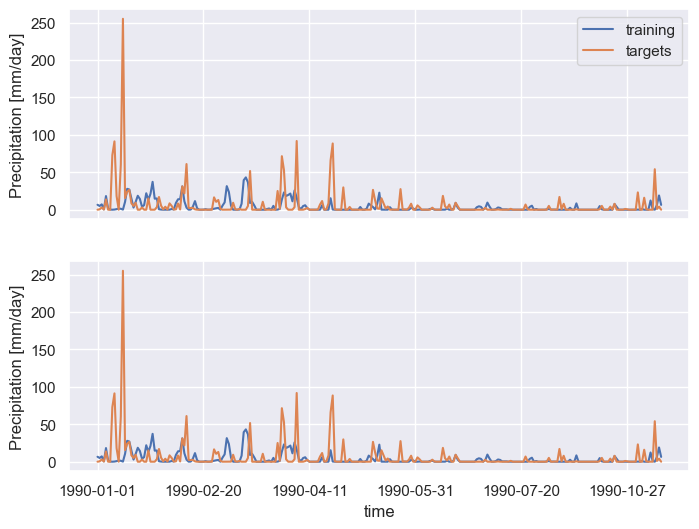

In [36]:
# print a table of the training/targets data
display(pd.concat({'training': training, 'targets': targets}, axis=1))
#display(pd.DataFrame.merge(training,targets,on='time'))

# make a plot of the temperature and precipitation data
fig, axes = plt.subplots(ncols=1, nrows=2, figsize=(8, 6), sharex=True)
time_slice = slice('1990-01-01', '1990-12-31')

# plot-temperature
training[time_slice]['pcp'].plot(ax=axes[0], label='training')
targets[time_slice]['pcp'].plot(ax=axes[0], label='targets')
axes[0].legend()
axes[0].set_ylabel('Precipitation [mm/day]')

# plot-precipitation
training[time_slice]['pcp'].plot(ax=axes[1])
targets[time_slice]['pcp'].plot(ax=axes[1])
_ = axes[1].set_ylabel('Precipitation [mm/day]')

In [37]:
df=pd.concat({'training': training, 'targets': targets}, axis=1)

df=df.dropna()
df

,training,targets
,pcp,pcp
time,,
1970-01-01,15.221261,0.0
1970-01-02,15.258603,0.0
1970-01-03,3.232764,0.0
1970-01-04,0.340715,2.5
1970-01-05,2.544045,10.3
...,...,...
2014-12-16,0.000000,0.5
2014-12-17,0.095924,31.0


In [38]:
df1 = df.droplevel(1,axis=1)

In [39]:
df1

,training,targets
time,,
1970-01-01,15.221261,0.0
1970-01-02,15.258603,0.0
1970-01-03,3.232764,0.0
1970-01-04,0.340715,2.5
1970-01-05,2.544045,10.3
...,...,...
2014-12-16,0.000000,0.5
2014-12-17,0.095924,31.0
2014-12-18,0.272668,1.0


In [40]:
# list of models in mlinsights.mlmodel _init_

(10345, 1) (10345, 1) (7758, 1) (2587, 1) (7758, 1) (2587, 1)
kmeans 0.0011381747004387543
uniform 0.004093257294026098
quantile 0.004192440303128375


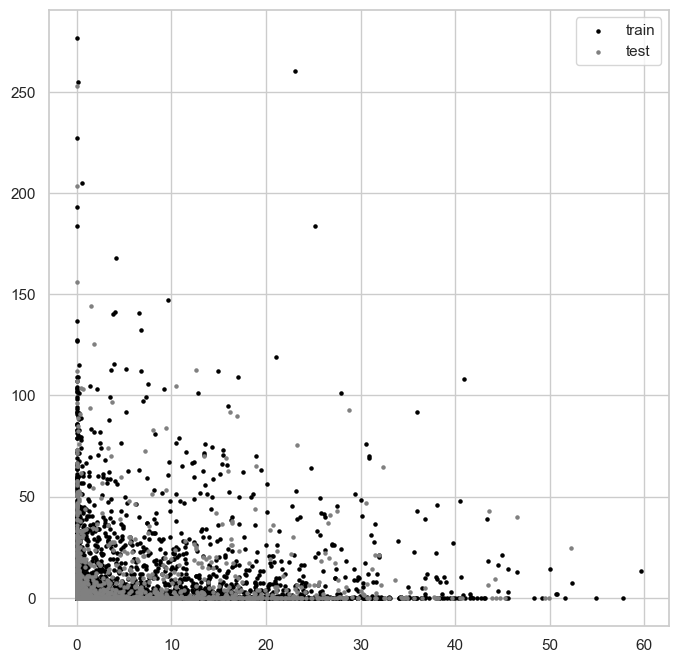

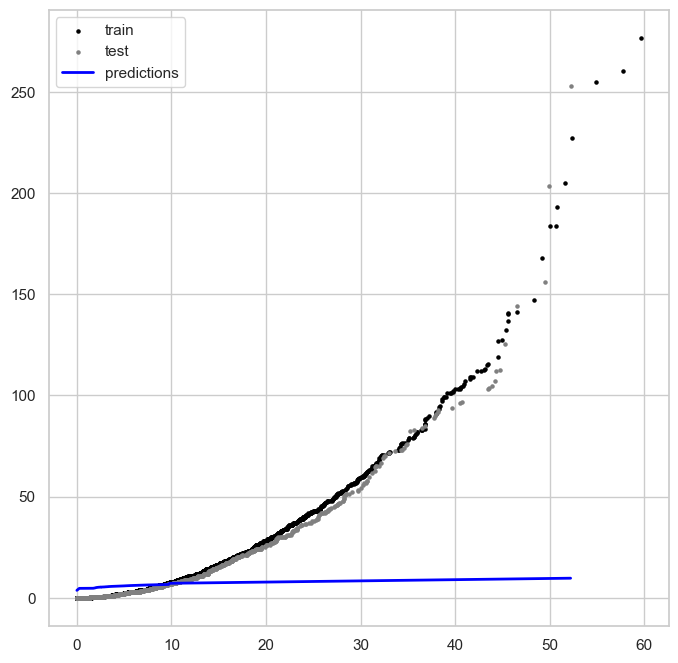

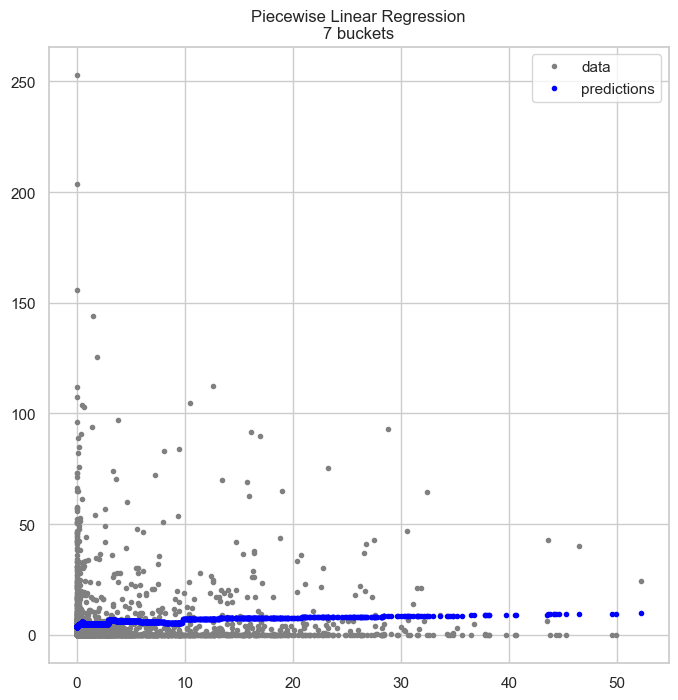

In [41]:
# exploratory data analysis for arrm model
import seaborn as sns
import numpy as np
from sklearn.model_selection import train_test_split
# train_test_split Quick utility that wraps input validation and
#    ``next(ShuffleSplit().split(X, y))`` and application to input data
#    into a single call for splitting (and optionally subsampling) data in a
#    oneliner.
#    Returns
#    -------
#    splitting : list, length=2 * len(arrays)
#        List containing train-test split of inputs.

#        .. versionadded:: 0.16
#            If the input is sparse, the output will be a
#            ``scipy.sparse.csr_matrix``. Else, output type is the same as the
#            input type.

from sklearn.pipeline import Pipeline
#The :mod:`sklearn.pipeline` module implements utilities to build a composite
#estimator, as a chain of transforms and estimators.
from sklearn.preprocessing import QuantileTransformer
#  This method transforms the features to follow a uniform or a normal
#    distribution. Therefore, for a given feature, this transformation tends
#    to spread out the most frequent values. It also reduces the impact of
#    (marginal) outliers: this is therefore a robust preprocessing scheme.

#    The transformation is applied on each feature independently. First an
#    estimate of the cumulative distribution function of a feature is
#    used to map the original values to a uniform distribution. The obtained
#    values are then mapped to the desired output distribution using the
#    associated quantile function. Features values of new/unseen data that fall
#    below or above the fitted range will be mapped to the bounds of the output
#    distribution. Note that this transform is non-linear. It may distort linear
#    correlations between variables measured at the same scale but renders
#    variables measured at different scales more directly comparable
from sklearn.preprocessing import KBinsDiscretizer
# use for discretization
from mlinsights.mlmodel import PiecewiseRegressor # in piecewise estimator
#     Uses a :epkg:`decision tree` to split the space of features
#    into buckets and trains a linear regression (default) on each of them.
#    The second estimator is usually a :epkg:`sklearn:linear_model:LinearRegression`.
#    It can also be :epkg:`sklearn:dummy:DummyRegressor` to just get
#    the average on each bucket.

def ARRM(n_bins=7):
    return Pipeline([
        ('')
    ])


sns.set(style='whitegrid')
c = {'train': 'black', 'predict': 'blue', 'test': 'grey'}

# parameters for Quantile transforms
qqwargs = {'n_quantiles': int(1e6), 'copy': True, 'subsample': int(1e6)} # add int for n_quantiles and subsample to avoid
# following problem:  InvalidParameterError: The 'n_quantiles' parameter of QuantileTransformer must be an int in the range [1, inf). Got 1000000.0 instead.
n_bins = 7



X = df1[['training']].values#['1980': '2014']#training[['pcp']]['1980': '2014'].values
y = df1[['targets']].values# targets[['pcp']]['1980': '2014'].values


X_train, X_test, y_train, y_test = train_test_split(X, y)# splits data


# Foloowing lines are not used with piesewiseRegressor
# preprocessing scheme : quantile maps transforms the data to follow a uniform or a normal distribution
xqt = QuantileTransformer(**qqwargs).fit(X_train)

Xq_train = xqt.transform(X_train) # function.transform (numpy.narray), applies a func on the numpy
Xq_test = xqt.transform(X_test)

yqt = QuantileTransformer(**qqwargs).fit(y_train)
yq_train = xqt.transform(y_train)[:, 0]
yq_test = xqt.transform(y_test)[:, 0]


print(X.shape, y.shape, X_train.shape, X_test.shape, y_train.shape, y_test.shape)

# model = PiecewiseRegressor(binner=KBinsDiscretizer(n_bins=n_bins, strategy='quantile'))
# model.fit(Xq_train, yq_train)
# predq = model.predict(Xq_test)
# pred = qt.inverse_transform(predq.reshape(-1, 1))

y_train = y_train[:, 0]
# KBinsDiscretizer use for discretization
#    strategy : {'uniform', 'quantile', 'kmeans'}, default='quantile'
#        Strategy used to define the widths of the bins.
#
#        - 'uniform': All bins in each feature have identical widths.
#        - 'quantile': All bins in each feature have the same number of points.
#        - 'kmeans': Values in each bin have the same nearest center of a 1D

for strat in ['kmeans', 'uniform', 'quantile']:
    model = PiecewiseRegressor(binner=KBinsDiscretizer(n_bins=n_bins, strategy=strat))
    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    print(strat, model.score(X_test, y_test)) 
    # how is the score calculated ?? do not find def score in piecewise_estimator where the model is
    
model = PiecewiseRegressor(binner=KBinsDiscretizer(n_bins=n_bins, strategy='quantile'))
model.fit(X_train, y_train)
pred = model.predict(X_test)


fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(X_train, y_train, c=c['train'], s=5, label='train')
plt.scatter(X_test, y_test, c=c['test'], s=5, label='test')
ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(np.sort(X_train, axis=0), np.sort(y_train, axis=0), c=c['train'], s=5, label='train')
plt.scatter(np.sort(X_test, axis=0), np.sort(y_test, axis=0), c=c['test'], s=5, label='test')
plt.plot(np.sort(X_test, axis=0), np.sort(pred, axis=0), c=c['predict'], lw=2, label='predictions')
ax.legend()

# fig, ax = plt.subplots(1, 1)
# ax.plot(Xq_test[:, 0], yq_test, ".", label='data', c=c['test'])
# ax.plot(Xq_test[:, 0], predq, ".", label="predictions", c=c['predict'])
# ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
# ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.plot(X_test[:, 0], y_test, ".", label='data', c=c['test'])
ax.plot(X_test[:, 0], pred, ".", label="predictions", c=c['predict'])
ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
ax.legend()

In [42]:
model

PiecewiseRegressor(binner=KBinsDiscretizer(n_bins=7),
                   estimator=LinearRegression())

In [43]:
from mlinsights.mlmodel import PiecewiseClassifier

In [44]:
model = PiecewiseClassifier()
model.fit(X_train, y_train)
pred = model.predict(X_test)
print(strat, model.score(X_test, y_test)) 
# how is the score calculated ?? do not find def score in piecewise_estimator where the model is
    
model = PiecewiseRegressor(binner=KBinsDiscretizer(n_bins=n_bins, strategy='kmeans'))
model.fit(X_train, y_train)
pred = model.predict(X_test)


fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(X_train, y_train, c=c['train'], s=5, label='train')
plt.scatter(X_test, y_test, c=c['test'], s=5, label='test')
ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(np.sort(X_train, axis=0), np.sort(y_train, axis=0), c=c['train'], s=5, label='train')
plt.scatter(np.sort(X_test, axis=0), np.sort(y_test, axis=0), c=c['test'], s=5, label='test')
plt.plot(np.sort(X_test, axis=0), np.sort(pred, axis=0), c=c['predict'], lw=2, label='predictions')
ax.legend()

# fig, ax = plt.subplots(1, 1)
# ax.plot(Xq_test[:, 0], yq_test, ".", label='data', c=c['test'])
# ax.plot(Xq_test[:, 0], predq, ".", label="predictions", c=c['predict'])
# ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
# ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.plot(X_test[:, 0], y_test, ".", label='data', c=c['test'])
ax.plot(X_test[:, 0], pred, ".", label="predictions", c=c['predict'])
ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
ax.legend()

ValueError: Unknown label type: 'continuous'

In [ ]:
from mlinsights.mlmodel import QuantileLinearRegression # in quantile_regression

In [ ]:
# test with oanother model
#for strat in ['kmeans','uniform', 'quantile']:
model = QuantileLinearRegression()
model.fit(X_train, y_train)
pred = model.predict(X_test)
print(model.score(X_test, y_test))# mean absolute error
    
#model = QuantileLinearRegression(binner=KBinsDiscretizer(n_bins=n_bins, strategy='kmeans'))
#model.fit(X_train, y_train)
#pred = model.predict(X_test)


fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(X_train, y_train, c=c['train'], s=5, label='train')
plt.scatter(X_test, y_test, c=c['test'], s=5, label='test')
ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(np.sort(X_train, axis=0), np.sort(y_train, axis=0), c=c['train'], s=5, label='train')
plt.scatter(np.sort(X_test, axis=0), np.sort(y_test, axis=0), c=c['test'], s=5, label='test')
plt.plot(np.sort(X_test, axis=0), np.sort(pred, axis=0), c=c['predict'], lw=2, label='predictions')
ax.legend()

# fig, ax = plt.subplots(1, 1)
# ax.plot(Xq_test[:, 0], yq_test, ".", label='data', c=c['test'])
# ax.plot(Xq_test[:, 0], predq, ".", label="predictions", c=c['predict'])
# ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
# ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.plot(X_test[:, 0], y_test, ".", label='data', c=c['test'])
ax.plot(X_test[:, 0], pred, ".", label="predictions", c=c['predict'])
ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
ax.legend()

In [ ]:
from mlinsights.mlmodel import QuantileMLPRegressor # in qunatile_mlpregressor

In [ ]:
# test with oanother model
#for strat in ['kmeans','uniform', 'quantile']:
model = QuantileMLPRegressor()
model.fit(X_train, y_train)
pred = model.predict(X_test)
print(model.score(X_test, y_test)) # mean absolute error
    
#model = QuantileLinearRegression(binner=KBinsDiscretizer(n_bins=n_bins, strategy='kmeans'))
#model.fit(X_train, y_train)
#pred = model.predict(X_test)


fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(X_train, y_train, c=c['train'], s=5, label='train')
plt.scatter(X_test, y_test, c=c['test'], s=5, label='test')
ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(np.sort(X_train, axis=0), np.sort(y_train, axis=0), c=c['train'], s=5, label='train')
plt.scatter(np.sort(X_test, axis=0), np.sort(y_test, axis=0), c=c['test'], s=5, label='test')
plt.plot(np.sort(X_test, axis=0), np.sort(pred, axis=0), c=c['predict'], lw=2, label='predictions')
ax.legend()

# fig, ax = plt.subplots(1, 1)
# ax.plot(Xq_test[:, 0], yq_test, ".", label='data', c=c['test'])
# ax.plot(Xq_test[:, 0], predq, ".", label="predictions", c=c['predict'])
# ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
# ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.plot(X_test[:, 0], y_test, ".", label='data', c=c['test'])
ax.plot(X_test[:, 0], pred, ".", label="predictions", c=c['predict'])
ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
ax.legend()

In [ ]:
from mlinsights.mlmodel import PiecewiseTreeRegressor

In [ ]:
# test with oanother model
#for strat in ['kmeans','uniform', 'quantile']:
model = PiecewiseTreeRegressor()
model.fit(X_train, y_train)
pred = model.transform(X_test)
print(model.score(X_test, y_test))
    
#model = QuantileLinearRegression(binner=KBinsDiscretizer(n_bins=n_bins, strategy='kmeans'))
#model.fit(X_train, y_train)
#pred = model.predict(X_test)


fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(X_train, y_train, c=c['train'], s=5, label='train')
plt.scatter(X_test, y_test, c=c['test'], s=5, label='test')
ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(np.sort(X_train, axis=0), np.sort(y_train, axis=0), c=c['train'], s=5, label='train')
plt.scatter(np.sort(X_test, axis=0), np.sort(y_test, axis=0), c=c['test'], s=5, label='test')
plt.plot(np.sort(X_test, axis=0), np.sort(pred, axis=0), c=c['predict'], lw=2, label='predictions')
ax.legend()

# fig, ax = plt.subplots(1, 1)
# ax.plot(Xq_test[:, 0], yq_test, ".", label='data', c=c['test'])
# ax.plot(Xq_test[:, 0], predq, ".", label="predictions", c=c['predict'])
# ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
# ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.plot(X_test[:, 0], y_test, ".", label='data', c=c['test'])
ax.plot(X_test[:, 0], pred, ".", label="predictions", c=c['predict'])
ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
ax.legend()

In [ ]:
from mlinsights.mlmodel import PredictableTSNE

In [ ]:
# test with oanother model
#for strat in ['kmeans','uniform', 'quantile']:
model = PredictableTSNE()
model.fit(X_train, y_train)
pred = model.transform(X_test)
print(model.score(X_test, y_test))
    
#model = QuantileLinearRegression(binner=KBinsDiscretizer(n_bins=n_bins, strategy='kmeans'))
#model.fit(X_train, y_train)
#pred = model.predict(X_test)


fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(X_train, y_train, c=c['train'], s=5, label='train')
plt.scatter(X_test, y_test, c=c['test'], s=5, label='test')
ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(np.sort(X_train, axis=0), np.sort(y_train, axis=0), c=c['train'], s=5, label='train')
plt.scatter(np.sort(X_test, axis=0), np.sort(y_test, axis=0), c=c['test'], s=5, label='test')
plt.plot(np.sort(X_test, axis=0), np.sort(pred, axis=0), c=c['predict'], lw=2, label='predictions')
ax.legend()

# fig, ax = plt.subplots(1, 1)
# ax.plot(Xq_test[:, 0], yq_test, ".", label='data', c=c['test'])
# ax.plot(Xq_test[:, 0], predq, ".", label="predictions", c=c['predict'])
# ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
# ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.plot(X_test[:, 0], y_test, ".", label='data', c=c['test'])
ax.plot(X_test[:, 0], pred, ".", label="predictions", c=c['predict'])
ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
ax.legend()

In [ ]:
from mlinsights.mlmodel import ConstraintKMeans

In [ ]:
# test with oanother model
#for strat in ['kmeans','uniform', 'quantile']:
model = ConstraintKMeans()
model.fit(X_train, y_train)
pred = model.transform(X_test)
print(model.score(X_test, y_test))
    
#model = QuantileLinearRegression(binner=KBinsDiscretizer(n_bins=n_bins, strategy='kmeans'))
#model.fit(X_train, y_train)
#pred = model.predict(X_test)


fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(X_train, y_train, c=c['train'], s=5, label='train')
plt.scatter(X_test, y_test, c=c['test'], s=5, label='test')
ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
plt.scatter(np.sort(X_train, axis=0), np.sort(y_train, axis=0), c=c['train'], s=5, label='train')
plt.scatter(np.sort(X_test, axis=0), np.sort(y_test, axis=0), c=c['test'], s=5, label='test')
plt.plot(np.sort(X_test, axis=0), np.sort(pred, axis=0), c=c['predict'], lw=2, label='predictions')
ax.legend()

# fig, ax = plt.subplots(1, 1)
# ax.plot(Xq_test[:, 0], yq_test, ".", label='data', c=c['test'])
# ax.plot(Xq_test[:, 0], predq, ".", label="predictions", c=c['predict'])
# ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
# ax.legend()

fig, ax = plt.subplots(1, 1, figsize=(8, 8))
ax.plot(X_test[:, 0], y_test, ".", label='data', c=c['test'])
ax.plot(X_test[:, 0], pred, ".", label="predictions", c=c['predict'])
ax.set_title(f"Piecewise Linear Regression\n{n_bins} buckets")
ax.legend()

In [ ]:
# TEST BCSD

In [45]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
import xarray as xr
from skdownscale.pointwise_models import BcsdPrecipitation, BcsdTemperature

In [46]:
# utilities for plotting cdfs
def plot_cdf(ax=None, **kwargs):
    if ax:
        plt.sca(ax)
    else:
        ax = plt.gca()

    for label, X in kwargs.items():
        vals = np.sort(X, axis=0)
        pp = scipy.stats.mstats.plotting_positions(vals)
        ax.plot(pp, vals, label=label)
    ax.legend()
    return ax


def plot_cdf_by_month(ax=None, **kwargs):
    fig, axes = plt.subplots(4, 3, sharex=True, sharey=False, figsize=(12, 8))

    for label, X in kwargs.items():
        for month, ax in zip(range(1, 13), axes.flat):

            vals = np.sort(X[X.index.month == month], axis=0)
            pp = scipy.stats.mstats.plotting_positions(vals)
            ax.plot(pp, vals, label=label)
            ax.set_title(month)
    ax.legend()
    return ax

In [47]:
X = df1[['training']].values#['1980': '2014']#training[['pcp']]['1980': '2014'].values
y = df1[['targets']].values# targets[['pcp']]['1980': '2014'].values

#X_temp.index = pd.to_datetime(X_temp.index)
#y_temp.index = pd.to_datetime(y_temp.index)

In [48]:
#X_train, X_test, y_train, y_test = train_test_split(X, y)# splits data

In [49]:
df1[['training']].loc['1970-01-01':'1980-01-01']

,training
time,
1970-01-01,15.221261
1970-01-02,15.258603
1970-01-03,3.232764
1970-01-04,0.340715
1970-01-05,2.544045
...,...
1979-12-28,0.295247
1979-12-29,0.102075
1979-12-30,0.082439


In [50]:
df1

,training,targets
time,,
1970-01-01,15.221261,0.0
1970-01-02,15.258603,0.0
1970-01-03,3.232764,0.0
1970-01-04,0.340715,2.5
1970-01-05,2.544045,10.3
...,...,...
2014-12-16,0.000000,0.5
2014-12-17,0.095924,31.0
2014-12-18,0.272668,1.0


In [51]:
X_train = df1[['training']].loc['1970-01-01':'1990-01-01']
X_test = df1[['training']].loc['1990-01-01':'2010-01-01']
y_train = df1[['targets']].loc['1970-01-01':'1990-01-01']
y_test = df1[['targets']].loc['1990-01-01':'2010-01-01']

In [52]:
X_train.index = pd.to_datetime(X_train.index)
y_train.index = pd.to_datetime(y_train.index)

X_test.index = pd.to_datetime(X_test.index)
y_test.index = pd.to_datetime(y_test.index)

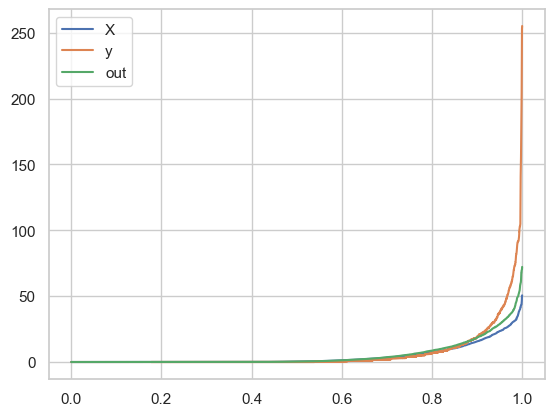

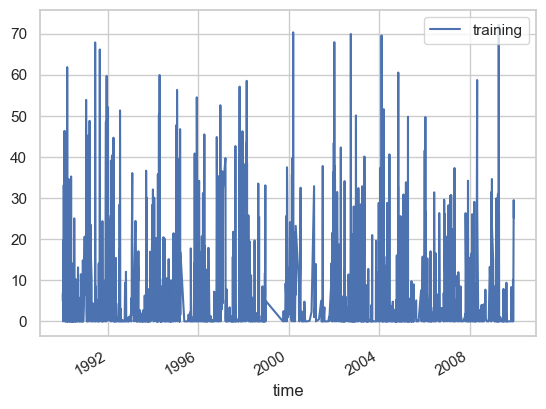

In [53]:
# Fit/predict the BCSD Temperature model
bcsd_temp = BcsdPrecipitation()
bcsd_temp.fit(X_train, y_train)
out = bcsd_temp.predict(X_test) + X_test
plot_cdf(X=X_test, y=y_test, out=out)
out.plot()
out=out.rename(columns={'training':'pcp'})

In [54]:
plot_cdf_by_month(X=X_temp, y=y_temp.loc[list(X_temp.index)], out=out)

NameError: name 'X_temp' is not defined

In [ ]:
out

Text(0, 0.5, 'Precipitation [mm/day]')

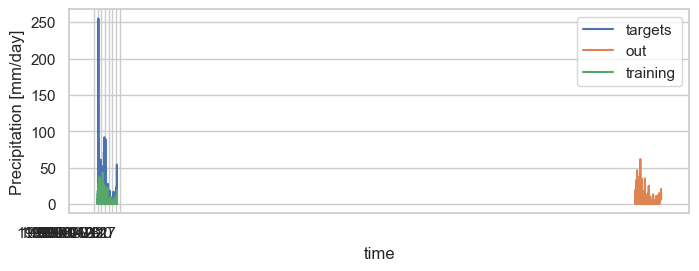

In [56]:
# make a plot of the temperature and precipitation data
fig, axes = plt.subplots(ncols=1, nrows=1, figsize=(8, 3), sharex=True)
time_slice = slice('1990-01-01', '1990-12-31')

# plot-temperature
targets[time_slice]['pcp'].plot(label='targets')
out[time_slice]['pcp'].plot(label='out')
training[time_slice]['pcp'].plot(label='training')
axes.legend()
axes.set_ylabel('Precipitation [mm/day]')

In [ ]:
# make a plot of the temperature and precipitation data
fig, axes = plt.subplots(ncols=1, nrows=3, figsize=(8, 9), sharex=True)
time_slice = slice('1990-01-01', '1990-12-31')

# plot-temperature
training[time_slice]['pcp'].plot(ax=axes[0], label='training')
axes[0].legend()
axes[0].set_ylabel('Precipitation [mm/day]')
axes[0].set_ylim(0,250)


# plot-precipitation
targets[time_slice]['pcp'].plot(ax=axes[1], label='target')
axes[1].legend()
_ = axes[1].set_ylabel('Precipitation [mm/day]')
axes[1].set_ylim(0,250)

# plot-precipitation
out[time_slice]['pcp'].plot(ax=axes[2], label='out')
axes[2].legend()
_ = axes[2].set_ylabel('Precipitation [mm/day]')
axes[2].set_ylim(0,250)


In [ ]:
out

In [ ]:
y_temp

In [ ]:
# do again
# Fit/predict the BCSD Temperature model
bcsd_temp = BcsdPrecipitation()
bcsd_temp.fit(out.loc['1990':'2000'], y_temp.loc[list(out.loc['1990':'2000'].index)])
out2 = bcsd_temp.predict(out.loc['2000':'2009']) + out.loc['2000':'2009']
plot_cdf(X=out, y=y_temp.loc[list(out.index)], out=out2)
out2.plot()
out2=out2.rename(columns={'training':'pcp'})

In [ ]:
plot_cdf_by_month(X=out, y=y_temp.loc[list(out.index)], out=out2)

NameError: name 'out2' is not defined

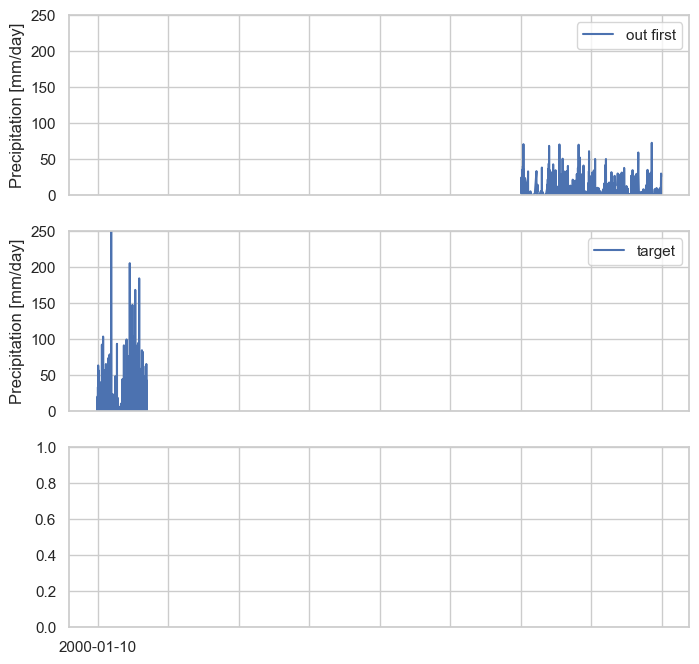

In [55]:
# make a plot of the temperature and precipitation data
fig, axes = plt.subplots(ncols=1, nrows=3, figsize=(8, 9), sharex=True)
time_slice = slice('2000-01-01', '2009-12-31')

# plot-temperature
out[time_slice]['pcp'].plot(ax=axes[0], label='out first')
axes[0].legend()
axes[0].set_ylabel('Precipitation [mm/day]')
axes[0].set_ylim(0,250)


# plot-precipitation
targets[time_slice]['pcp'].plot(ax=axes[1], label='target')
axes[1].legend()
_ = axes[1].set_ylabel('Precipitation [mm/day]')
axes[1].set_ylim(0,250)

# plot-precipitation
out2[time_slice]['pcp'].plot(ax=axes[2], label='out second')
axes[2].legend()
_ = axes[2].set_ylabel('Precipitation [mm/day]')
axes[2].set_ylim(0,250)


In [57]:
# do again
# Fit/predict the BCSD Temperature model
bcsd_temp = BcsdPrecipitation()
bcsd_temp.fit(out.loc['1990':'2000'], y_temp.loc[list(out.loc['1990':'2000'].index)])
out2 = bcsd_temp.predict(out.loc['2000':'2009']) + out.loc['2000':'2009']
plot_cdf(X=out, y=y_temp.loc[list(out.index)], out=out2)
out2.plot()
out2=out2.rename(columns={'training':'pcp'})

NameError: name 'y_temp' is not defined

In [58]:
plot_cdf_by_month(X=out, y=y_temp.loc[list(out.index)], out=out2)

NameError: name 'y_temp' is not defined

NameError: name 'out2' is not defined

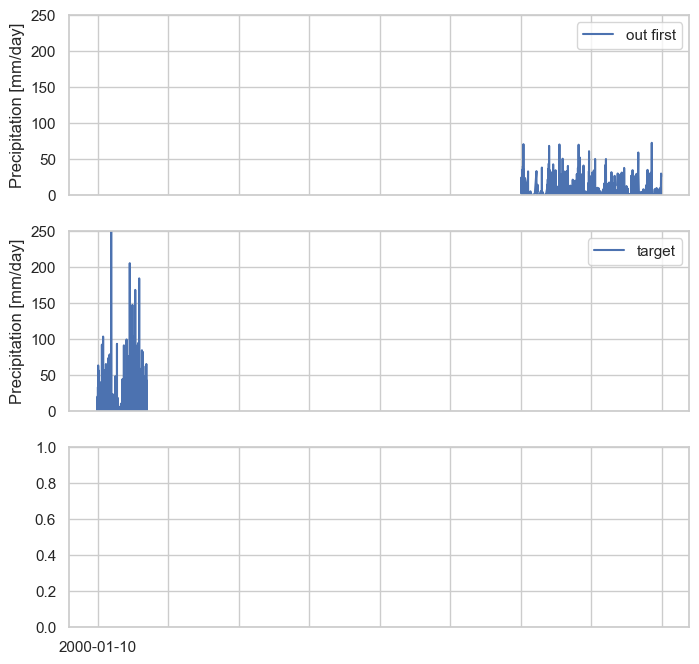

In [59]:
# make a plot of the temperature and precipitation data
fig, axes = plt.subplots(ncols=1, nrows=3, figsize=(8, 9), sharex=True)
time_slice = slice('2000-01-01', '2009-12-31')

# plot-temperature
out[time_slice]['pcp'].plot(ax=axes[0], label='out first')
axes[0].legend()
axes[0].set_ylabel('Precipitation [mm/day]')
axes[0].set_ylim(0,250)


# plot-precipitation
targets[time_slice]['pcp'].plot(ax=axes[1], label='target')
axes[1].legend()
_ = axes[1].set_ylabel('Precipitation [mm/day]')
axes[1].set_ylim(0,250)

# plot-precipitation
out2[time_slice]['pcp'].plot(ax=axes[2], label='out second')
axes[2].legend()
_ = axes[2].set_ylabel('Precipitation [mm/day]')
axes[2].set_ylim(0,250)


In [60]:
# function qui marche pour precipitation return period

def dataframe_threshold_coresponding_to_return_period_obs(df):
    df_copy=df.copy(deep=True)
    df_copy=df_copy.drop(labels='Date',axis=1)
    df_max = df_copy.groupby(['Name project','Experiment','Model','Year']).max() # maximum    
    midx = pd.MultiIndex.from_product([list(set(df_copy[df_copy.columns[0]])),list(set(df_copy[df_copy.columns[1]])),list(set(df_copy[df_copy.columns[2]]))],names=['Name project','Experiment', 'Model'])
    cols = ['Value for return period 50 years mm/day','Value for return period 100 years mm/day']
    return_period = pd.DataFrame(data = [], 
                                index = midx,
                                columns = cols)
    for name_p in return_period.index.levels[0].tolist():
        for ssp in return_period.index.levels[1].tolist():
            for model in return_period.index.levels[2].tolist():
                print('Name project '+name_p+ ' ssp '+ssp+ ' model '+model)
                Z=df_max.loc[(name_p,ssp,model)]['Mean of the daily precipitation rate mm_per_day'].values.reshape(len(df_max.loc[(name_p,ssp,model)]['Mean of the daily precipitation rate mm_per_day']),)
                (loc1,scale)=stats.gumbel_r.fit(Z) # return the function necessary to establish the continous function
                # choice of gumbel because suits to extreme precipitation
                return_period.loc[(name_p,ssp,model),('Value for return period 50 years mm/day')] = threshold_coresponding_to_return_period(loc1,scale,50)
                return_period.loc[(name_p,ssp,model),('Value for return period 100 years mm/day')] = threshold_coresponding_to_return_period(loc1,scale,100)
                
    return return_period

In [61]:
# function qui marche pour precipitation return period


def threshold_coresponding_to_return_period(loc,scale,T):
    p_non_exceedance = 1 - (1/T)
    try:
        threshold_coresponding = round(gumbel_r.ppf(p_non_exceedance,loc,scale))
    except OverflowError: # the result is not finite
        if math.isinf(gumbel_r.ppf(p_non_exceedance,loc,scale)) and gumbel_r.ppf(p_non_exceedance,loc,scale)<0:
            # ppf is the inverse of cdf
            # the result is -inf
            threshold_coresponding = 0 # the value of wero is imposed
    return threshold_coresponding

In [62]:
from Functions_Indicators import add_year_month_season # need to add conversion of time

In [63]:
out2 = add_year_month_season(out2.reset_index(),'time')

NameError: name 'out2' is not defined

In [64]:
out2.index=out2.index.strftime('%Y-%m-%d')

NameError: name 'out2' is not defined

In [65]:
Z=out2.groupby('Year')[['pcp']].max()

NameError: name 'out2' is not defined

In [66]:
(loc1,scale)=stats.gumbel_r.fit(Z) # return the function necessary to establish the continous function
# choice of gumbel because suits to extreme precipitation
#return_period.loc[(name_p,ssp,model),('Value for return period 50 years mm/day')] = 
threshold_coresponding_to_return_period(loc1,scale,50) #122
#return_period.loc[(name_p,ssp,model),('Value for return period 100 years mm/day')] = 
#threshold_coresponding_to_return_period(loc1,scale,100) # 132


NameError: name 'stats' is not defined

In [67]:
from scipy import stats
from scipy.stats import gumbel_r
from scipy.stats import gumbel_l

In [68]:
training.index=training.index.strftime('%Y-%m-%d')

AttributeError: 'Index' object has no attribute 'strftime'

In [ ]:
training = add_year_month_season(training.reset_index(),'time')

In [69]:
Z=training.groupby('Year')[['pcp']].max()

KeyError: 'Year'

In [ ]:
(loc1,scale)=stats.gumbel_r.fit(Z) # return the function necessary to establish the continous function
# choice of gumbel because suits to extreme precipitation
#return_period.loc[(name_p,ssp,model),('Value for return period 50 years mm/day')] = 
#threshold_coresponding_to_return_period(loc1,scale,50) ## 69
#return_period.loc[(name_p,ssp,model),('Value for return period 100 years mm/day')] = 
threshold_coresponding_to_return_period(loc1,scale,100) # 75

In [ ]:
def return_period(df,T):
    #df.index=df.index.strftime('%Y-%m-%d')
    df = add_year_month_season(df.reset_index(),'time')
    Z=df.groupby('Year')[['pcp']].max()
    (loc1,scale)=stats.gumbel_r.fit(Z) # return the function necessary to establish the continous function
    return_p=threshold_coresponding_to_return_period(loc1,scale,T)
    return return_p

In [ ]:
return_period(targets,50)

In [ ]:
return_period(targets,100)

In [ ]:
targets.index

In [ ]:
targets

<Axes: xlabel='time'>

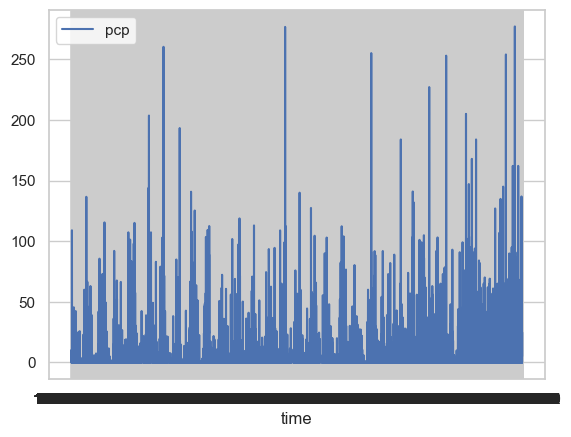

In [70]:
sns.lineplot(targets)

In [71]:
out2

NameError: name 'out2' is not defined

In [ ]:
# BC a third time

In [ ]:
out2

In [ ]:
# do again
# Fit/predict the BCSD Temperature model
bcsd_temp = BcsdPrecipitation()
bcsd_temp.fit(out2[['time','pcp']].set_index('time').loc['2000':'2005'], y_temp.loc[list(out2[['time','pcp']].set_index('time').loc['2000':'2005'].index)])
out3 = bcsd_temp.predict(out2[['time','pcp']].set_index('time').loc['2005':'2009']) + out2[['time','pcp']].set_index('time').loc['2005':'2009']
plot_cdf(X=out2[['time','pcp']], y=y_temp.loc[list(out2[['time','pcp']].index)], out=out3)
out3.plot()
out3=out3.rename(columns={'training':'pcp'})

In [ ]:
plot_cdf_by_month(X=out2, y=y_temp.loc[list(out2.index)], out=out3)

In [ ]:
# make a plot of the temperature and precipitation data
fig, axes = plt.subplots(ncols=1, nrows=3, figsize=(8, 9), sharex=True)
time_slice = slice('1990-01-01', '1990-12-31')

# plot-temperature
out[time_slice]['pcp'].plot(ax=axes[0], label='out first')
axes[0].legend()
axes[0].set_ylabel('Precipitation [mm/day]')
axes[0].set_ylim(0,250)


# plot-precipitation
targets[time_slice]['pcp'].plot(ax=axes[1], label='target')
axes[1].legend()
_ = axes[1].set_ylabel('Precipitation [mm/day]')
axes[1].set_ylim(0,250)

# plot-precipitation
out2[time_slice]['pcp'].plot(ax=axes[2], label='out second')
axes[2].legend()
_ = axes[2].set_ylabel('Precipitation [mm/day]')
axes[2].set_ylim(0,250)

In [ ]:
pred

Scikit-downscale, the ability to test and compare arbitrary combinations of models under a common interface. This allows us to try many combinations of models and parameters, choosing only the best combinations. 

In [ ]:
import skdownscale
from skdownscale.pointwise_models import bcsd # name of the model to write 

# all modeled listed here
# C:\Users\CLMRX\AppData\Local\miniconda3\envs\geodata\Lib\site-packages\skdownscale\pointwise_models

In [ ]:
#parameters = {'detrend':True}

# parameters for QuantileMapper in bcsd
r'''
    Parameters
    ----------
    detrend : boolean, optional
        If True, detrend the data before quantile mapping and add the trend
        back after transforming. Default is False.
    lt_kwargs : dict, optional
        Dictionary of keyword arguments to pass to the LinearTrendTransformer
    qm_kwargs : dict, optional
        Dictionary of keyword arguments to pass to the QuantileMapper'''

model = bcsd.BcsdPrecipitation()#**parameters
X = df1[['training']]#['1980': '2014']#training[['pcp']]['1980': '2014'].values
y = df1[['targets']]# targets[['pcp']]['1980': '2014'].values

X_train, X_test, y_train, y_test = train_test_split(X, y)
model.fit(X_train, y_train) # problem, both vector do not have the same length. Problem comes from train_test_split(X, y), defined in _split.py,
# in C:\Users\CLMRX\AppData\Local\miniconda3\envs\geodata\Lib\site-packages\sklearn\model_selection 
# try to find _safe_indexing function, that generates return values. Say it is in utils but not found
predictions = model.predict(X_predict)

In [ ]:
len(y)-len(X_train)

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

from skdownscale.pointwise_models import PureAnalog, AnalogRegression
from skdownscale.pointwise_models import BcsdTemperature, BcsdPrecipitation


models = {
    'GARD: PureAnalog-best-1': PureAnalog(kind='best_analog', n_analogs=1),
    'GARD: PureAnalog-sample-10': PureAnalog(kind='sample_analogs', n_analogs=10),
    'GARD: PureAnalog-weight-10': PureAnalog(kind='weight_analogs', n_analogs=10),
    'GARD: PureAnalog-weight-100': PureAnalog(kind='weight_analogs', n_analogs=100),
    'GARD: PureAnalog-mean-10': PureAnalog(kind='mean_analogs', n_analogs=10),
    'GARD: AnalogRegression-100': AnalogRegression(n_analogs=100),
    'GARD: LinearRegression': LinearRegression(),
    'BCSD: BcsdTemperature': BcsdTemperature(return_anoms=False),
    'Sklearn: RandomForestRegressor': RandomForestRegressor(random_state=0)
}

#train_slice = slice('1980-01-01', '1989-12-31')
#predict_slice = slice('1990-01-01', '1999-12-31')
train_slice = slice(datetime.date(1980, 1, 1), datetime.date(1989, 12, 31))
predict_slice = slice(datetime.date(1990, 1, 1), datetime.date(1999, 12, 31))

In [ ]:
# extract training / prediction data
X_train = training[['pcp']][train_slice]
y_train = targets[['pcp']][train_slice]
X_predict = training[['pcp']][predict_slice]

# Fit all models
for key, model in models.items():
    model.fit(X_train, y_train)